# Mask R-CNN - Inspect Ballon Trained Model

Code and visualizations to test, debug, and evaluate the Mask R-CNN model.

In [31]:
import sys
sys.path.append('D:/Machine Learning/Paper/Object Detection/Mask_RCNN-master/samples/balloon')
sys.path.append('D:/Machine Learning/Paper/Object Detection/Mask_RCNN-master')

In [32]:
import random
import math
import re
import time
import numpy as np
import tensorflow as tf
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import os
os.chdir('D://Machine Learning//Paper//Object Detection//Mask_RCNN-master')
# Root directory of the project
ROOT_DIR = os.getcwd()
if ROOT_DIR.endswith("samples/balloon"):
    # Go up two levels to the repo root
    ROOT_DIR = os.path.dirname(os.path.dirname(ROOT_DIR))

# Import Mask RCNN
sys.path.append(ROOT_DIR)
import utils
import visualize
from visualize import display_images
import model as modellib
from model import log

import balloon

%matplotlib inline 

# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

# Path to Ballon trained weights
# You can download this file from the Releases page
# https://github.com/matterport/Mask_RCNN/releases
BALLON_WEIGHTS_PATH = "/path/to/mask_rcnn_balloon.h5"  # TODO: update this path

## Configurations

In [33]:
config = balloon.BalloonConfig()
BALLOON_DIR = os.path.join(ROOT_DIR, "datasets/balloon")

In [34]:
BALLOON_DIR

'D:\\Machine Learning\\Paper\\Object Detection\\Mask_RCNN-master\\datasets/balloon'

In [35]:
# Override the training configurations with a few
# changes for inferencing.
class InferenceConfig(config.__class__):
    # Run detection on one image at a time
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

config = InferenceConfig()
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_SHAPES                [[256 256]
 [128 128]
 [ 64  64]
 [ 32  32]
 [ 16  16]]
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.9
DETECTION_NMS_THRESHOLD        0.3
GPU_COUNT                      1
IMAGES_PER_GPU                 1
IMAGE_MAX_DIM                  1024
IMAGE_MIN_DIM                  800
IMAGE_PADDING                  True
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
MASK_POOL_SIZE                 14
MASK_SHAPE                     [28, 28]
MAX_GT_INSTANCES               100
MEAN_PIXEL                     [123.7 116.8 103.9]
MINI_MASK_SHAPE                (56, 56)
NAME                           balloon
NUM_CLASSES                    2
POOL_SIZE                      7
POST_NMS_ROIS_INFERE

## Notebook Preferences

In [36]:
# Device to load the neural network on.
# Useful if you're training a model on the same 
# machine, in which case use CPU and leave the
# GPU for training.
DEVICE = "/cpu:0"  # /cpu:0 or /gpu:0

# Inspect the model in training or inference modes
# values: 'inference' or 'training'
# TODO: code for 'training' test mode not ready yet
TEST_MODE = "inference"

In [37]:
def get_ax(rows=1, cols=1, size=16):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.
    
    Adjust the size attribute to control how big to render images
    """
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax

## Load Validation Dataset

In [38]:
# Load validation dataset
dataset = balloon.BalloonDataset()
dataset.load_balloon(BALLOON_DIR, "val")

# Must call before using the dataset
dataset.prepare()

print("Images: {}\nClasses: {}".format(len(dataset.image_ids), dataset.class_names))

Images: 13
Classes: ['BG', 'balloon']


In [39]:
# Load dataset
# Get the dataset from the releases page
# https://github.com/matterport/Mask_RCNN/releases
dataset = balloon.BalloonDataset()
dataset.load_balloon(BALLOON_DIR, "train")

# Must call before using the dataset
dataset.prepare()

print("Image Count: {}".format(len(dataset.image_ids)))
print("Class Count: {}".format(dataset.num_classes))
for i, info in enumerate(dataset.class_info):
    print("{:3}. {:50}".format(i, info['name']))

Image Count: 61
Class Count: 2
  0. BG                                                
  1. balloon                                           


image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000
image_meta               shape: (10,)                 min:    0.00000  max: 1024.00000
class_ids                shape: (2,)                  min:    1.00000  max:    1.00000
bbox                     shape: (2, 4)                min:  362.00000  max: 1024.00000
mask                     shape: (56, 56, 2)           min:    0.00000  max:    1.00000


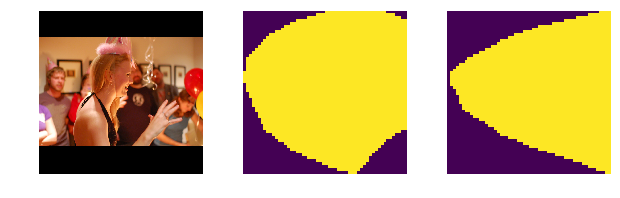

In [40]:
image_id = np.random.choice(dataset.image_ids, 1)[0]
image, image_meta, class_ids, bbox, mask = modellib.load_image_gt(dataset, config, image_id, use_mini_mask=True)

log("image", image)
log("image_meta", image_meta)
log("class_ids", class_ids)
log("bbox", bbox)
log("mask", mask)

display_images([image]+[mask[:,:,i] for i in range(min(mask.shape[-1], 7))])

## Load Model

In [41]:
import os
import sys
import glob
import random
import math
import datetime
import itertools
import json
import re
import logging
from collections import OrderedDict
import numpy as np
import scipy.misc
import tensorflow as tf
import keras
import keras.backend as K
import keras.layers as KL
import keras.initializers as KI
import keras.engine as KE
import keras.models as KM

import utils

In [42]:
mode="training"
model_dir=MODEL_DIR

In [43]:
class BatchNorm(KL.BatchNormalization):
    """Batch Normalization class. Subclasses the Keras BN class and
    hardcodes training=False so the BN layer doesn't update
    during training.

    Batch normalization has a negative effect on training if batches are small
    so we disable it here.
    """

    def call(self, inputs, training=None):
        return super(self.__class__, self).call(inputs, training=False)

In [44]:
def conv_block(input_tensor, kernel_size, filters, stage, block,
               strides=(2, 2), use_bias=True):
    """conv_block is the block that has a conv layer at shortcut
    # Arguments
        input_tensor: input tensor
        kernel_size: defualt 3, the kernel size of middle conv layer at main path
        filters: list of integers, the nb_filters of 3 conv layer at main path
        stage: integer, current stage label, used for generating layer names
        block: 'a','b'..., current block label, used for generating layer names
    Note that from stage 3, the first conv layer at main path is with subsample=(2,2)
    And the shortcut should have subsample=(2,2) as well
    """
    nb_filter1, nb_filter2, nb_filter3 = filters
    conv_name_base = 'res' + str(stage) + block + '_branch'
    bn_name_base = 'bn' + str(stage) + block + '_branch'

    x = KL.Conv2D(nb_filter1, (1, 1), strides=strides,
                  #这里用1*1的kernel + stride2不是会丢失很多信息嘛 ？
                  name=conv_name_base + '2a', use_bias=use_bias)(input_tensor)
    x = BatchNorm(axis=3, name=bn_name_base + '2a')(x)
    x = KL.Activation('relu')(x)

    x = KL.Conv2D(nb_filter2, (kernel_size, kernel_size), padding='same',
                  name=conv_name_base + '2b', use_bias=use_bias)(x)
    x = BatchNorm(axis=3, name=bn_name_base + '2b')(x)
    x = KL.Activation('relu')(x)

    x = KL.Conv2D(nb_filter3, (1, 1), name=conv_name_base +
                  '2c', use_bias=use_bias)(x)
    x = BatchNorm(axis=3, name=bn_name_base + '2c')(x)

    shortcut = KL.Conv2D(nb_filter3, (1, 1), strides=strides,
                         name=conv_name_base + '1', use_bias=use_bias)(input_tensor)
    shortcut = BatchNorm(axis=3, name=bn_name_base + '1')(shortcut)

    x = KL.Add()([x, shortcut])
    x = KL.Activation('relu', name='res' + str(stage) + block + '_out')(x)
    return x

In [45]:
def identity_block(input_tensor, kernel_size, filters, stage, block,
                   use_bias=True):
    """The identity_block is the block that has no conv layer at shortcut
    # Arguments
        input_tensor: input tensor
        kernel_size: defualt 3, the kernel size of middle conv layer at main path
        filters: list of integers, the nb_filters of 3 conv layer at main path
        stage: integer, current stage label, used for generating layer names
        block: 'a','b'..., current block label, used for generating layer names
    """
    nb_filter1, nb_filter2, nb_filter3 = filters
    conv_name_base = 'res' + str(stage) + block + '_branch'
    bn_name_base = 'bn' + str(stage) + block + '_branch'

    x = KL.Conv2D(nb_filter1, (1, 1), name=conv_name_base + '2a',
                  use_bias=use_bias)(input_tensor)
    x = BatchNorm(axis=3, name=bn_name_base + '2a')(x)
    x = KL.Activation('relu')(x)

    x = KL.Conv2D(nb_filter2, (kernel_size, kernel_size), padding='same',
                  name=conv_name_base + '2b', use_bias=use_bias)(x)
    x = BatchNorm(axis=3, name=bn_name_base + '2b')(x)
    x = KL.Activation('relu')(x)

    x = KL.Conv2D(nb_filter3, (1, 1), name=conv_name_base + '2c',
                  use_bias=use_bias)(x)
    x = BatchNorm(axis=3, name=bn_name_base + '2c')(x)

    x = KL.Add()([x, input_tensor])
    x = KL.Activation('relu', name='res' + str(stage) + block + '_out')(x)
    return x

In [46]:
def resnet_graph(input_image, architecture, stage5=False):
    assert architecture in ["resnet50", "resnet101"]
    # input_image:<tf.Tensor 'input_image_1:0' shape=(?, 1024, 1024, 3) dtype=float32>
    # Stage 1
    x = KL.ZeroPadding2D((3, 3))(input_image)
    # x : <tf.Tensor 'zero_padding2d_2/Pad:0' shape=(?, 1030, 1030, 3) dtype=float32>
    x = KL.Conv2D(64, (7, 7), strides=(2, 2), name='conv1', use_bias=True)(x)
    # x : <tf.Tensor 'conv1_3/BiasAdd:0' shape=(?, 512, 512, 64) dtype=float32>
    x = BatchNorm(axis=3, name='bn_conv1')(x)
    # x : <tf.Tensor 'bn_conv1_1/batchnorm/add_1:0' shape=(?, 512, 512, 64) dtype=float32>
    x = KL.Activation('relu')(x)
    # x : <tf.Tensor 'activation_75/Relu:0' shape=(?, 512, 512, 64) dtype=float32>
    C1 = x = KL.MaxPooling2D((3, 3), strides=(2, 2), padding="same")(x)
    # C1 = x : <tf.Tensor 'max_pooling2d_2/MaxPool:0' shape=(?, 256, 256, 64) dtype=float32>
    # Stage 2
    x = conv_block(x, 3, [64, 64, 256], stage=2, block='a', strides=(1, 1))
    # x : <tf.Tensor 'res2a_out_1/Relu:0' shape=(?, 256, 256, 256) dtype=float32>
    # 开始residual叠加，经过conv_block后尺寸缩小2倍，
    # 通道数由filters参数控制，经过3层conv(第一层1*1 stride2)后和1*1 conv(stride2) shortcut相加
    x = identity_block(x, 3, [64, 64, 256], stage=2, block='b')
    # x : <tf.Tensor 'res2b_out_1/Relu:0' shape=(?, 256, 256, 256) dtype=float32>
    # identity block 是经过3层conv后和原始input相加，也不改变尺寸
    C2 = x = identity_block(x, 3, [64, 64, 256], stage=2, block='c')
    # x : <tf.Tensor 'res2c_out_1/Relu:0' shape=(?, 256, 256, 256) dtype=float32>
    # Stage 3
    x = conv_block(x, 3, [128, 128, 512], stage=3, block='a')
    # x : <tf.Tensor 'res3a_out_1/Relu:0' shape=(?, 128, 128, 512) dtype=float32>
    x = identity_block(x, 3, [128, 128, 512], stage=3, block='b')
    # x : <tf.Tensor 'res3b_out_1/Relu:0' shape=(?, 128, 128, 512) dtype=float32>
    x = identity_block(x, 3, [128, 128, 512], stage=3, block='c')
    # x : <tf.Tensor 'res3c_out_1/Relu:0' shape=(?, 128, 128, 512) dtype=float32>
    C3 = x = identity_block(x, 3, [128, 128, 512], stage=3, block='d')
    # x : <tf.Tensor 'res3d_out_1/Relu:0' shape=(?, 128, 128, 512) dtype=float32>
    # Stage 4
    x = conv_block(x, 3, [256, 256, 1024], stage=4, block='a')
    # x : <tf.Tensor 'res4a_out_1/Relu:0' shape=(?, 64, 64, 1024) dtype=float32>
    block_count = {"resnet50": 5, "resnet101": 22}[architecture]
    for i in range(block_count):
        x = identity_block(x, 3, [256, 256, 1024], stage=4, block=chr(98 + i))
    # x : <tf.Tensor 'res4w_out_1/Relu:0' shape=(?, 64, 64, 1024) dtype=float32>
    C4 = x
    # x : 
    # Stage 5
    if stage5:
        x = conv_block(x, 3, [512, 512, 2048], stage=5, block='a')
        # x : <tf.Tensor 'res5a_out_1/Relu:0' shape=(?, 32, 32, 2048) dtype=float32>
        x = identity_block(x, 3, [512, 512, 2048], stage=5, block='b')
        # x : <tf.Tensor 'res5b_out_1/Relu:0' shape=(?, 32, 32, 2048) dtype=float32>
        C5 = x = identity_block(x, 3, [512, 512, 2048], stage=5, block='c')
        # x : <tf.Tensor 'res5c_out_1/Relu:0' shape=(?, 32, 32, 2048) dtype=float32>
    else:
        C5 = None
    return [C1, C2, C3, C4, C5]

In [47]:
def rpn_graph(feature_map, anchors_per_location, anchor_stride):
    """Builds the computation graph of Region Proposal Network.

    feature_map: backbone features [batch, height, width, depth]
    anchors_per_location: number of anchors per pixel in the feature map
    anchor_stride: Controls the density of anchors. Typically 1 (anchors for
                   every pixel in the feature map), or 2 (every other pixel).

    Returns:
        rpn_logits: [batch, H, W, 2] Anchor classifier logits (before softmax)
        rpn_probs: [batch, H, W, 2] Anchor classifier probabilities.
        rpn_bbox: [batch, H, W, (dy, dx, log(dh), log(dw))] Deltas to be
                  applied to anchors.
    """
    # TODO: check if stride of 2 causes alignment issues if the featuremap
    #       is not even.
    # Shared convolutional base of the RPN
    shared = KL.Conv2D(512, (3, 3), 
                       padding='same', 
                       activation='relu',
                       strides=anchor_stride,
                       name='rpn_conv_shared')(feature_map)
    # shared : batch,H,W,512

    # Anchor Score. [batch, height, width, anchors per location * 2].
    x = KL.Conv2D(2 * anchors_per_location, 
                  # by default anchors_per_location = 3
                  (1, 1), 
                  padding='valid',
                  activation='linear', 
                  name='rpn_class_raw')(shared)
    # x : batch,H,W,6(2*3)

    # Reshape to [batch, anchors, 2]
    rpn_class_logits = KL.Lambda(
        lambda t: tf.reshape(t, [tf.shape(t)[0], -1, 2]))(x)
    # rpn_class_logits : batch,H*W*3,2

    # Softmax on last dimension of BG/FG.
    rpn_probs = KL.Activation(
        "softmax", name="rpn_class_xxx")(rpn_class_logits)
    # rpn_probs : batch,H*W*3,2

    # Bounding box refinement. [batch, H, W, anchors per location, depth]
    # where depth is [x, y, log(w), log(h)]
    x = KL.Conv2D(anchors_per_location * 4, (1, 1), padding="valid",
                  activation='linear', name='rpn_bbox_pred')(shared)
    # x : batch,H,W,4*3

    # Reshape to [batch, anchors, 4]
    rpn_bbox = KL.Lambda(lambda t: tf.reshape(t, [tf.shape(t)[0], -1, 4]))(x)
    # rpn_bbox : batch,H*W*3,4

    return [rpn_class_logits, rpn_probs, rpn_bbox]

In [48]:
def build_rpn_model(anchor_stride, anchors_per_location, depth):
    """Builds a Keras model of the Region Proposal Network.
    It wraps the RPN graph so it can be used multiple times with shared
    weights.

    anchors_per_location: number of anchors per pixel in the feature map
    anchor_stride: Controls the density of anchors. Typically 1 (anchors for
                   every pixel in the feature map), or 2 (every other pixel).
    depth: Depth of the backbone feature map.

    Returns a Keras Model object. The model outputs, when called, are:
    rpn_logits: [batch, H, W, 2] Anchor classifier logits (before softmax)
    rpn_probs: [batch, W, W, 2] Anchor classifier probabilities.
    rpn_bbox: [batch, H, W, (dy, dx, log(dh), log(dw))] Deltas to be
                applied to anchors.
    """
    input_feature_map = KL.Input(shape=[None, None, depth],name="input_rpn_feature_map")
    outputs = rpn_graph(input_feature_map, anchors_per_location, anchor_stride)
    return KM.Model([input_feature_map], outputs, name="rpn_model")

In [49]:
def batch_slice(inputs, graph_fn, batch_size, names=None):
    """Splits inputs into slices and feeds each slice to a copy of the given
    computation graph and then combines the results. It allows you to run a
    graph on a batch of inputs even if the graph is written to support one
    instance only.

    inputs: list of tensors. All must have the same first dimension length
    graph_fn: A function that returns a TF tensor that's part of a graph.
    batch_size: number of slices to divide the data into.
    names: If provided, assigns names to the resulting tensors.
    """
    if not isinstance(inputs, list):
        inputs = [inputs]

    outputs = []
    for i in range(batch_size):
        # 把[batch,:]变成[0,:],[1,:],[2,:]....[batch-1,:]
        # 既一个tensor沿着batch维拆成很多个第一维是1，后面维度不变的小tensor
        inputs_slice = [x[i] for x in inputs]
        # 拆小了之后每一个小tensor执行想要执行的function
        output_slice = graph_fn(*inputs_slice)
        # 保险起见，如果执行了之后输出不是tuple或list，强制转化一下
        if not isinstance(output_slice, (tuple, list)):
            output_slice = [output_slice]
        # 循环之后，输出的结果拼接成了一个列表
        outputs.append(output_slice)
    # Change outputs from a list of slices where each is
    # a list of outputs to a list of outputs and each has
    # a list of slices
    # 执行之前：[[out_piece1],[out_piece2]]
    outputs = list(zip(*outputs))
    # 执行之后：[(out_piece1,out_piece2)],为了后面tf.stack准备

    if names is None:
        names = [None] * len(outputs)

    result = [tf.stack(o, axis=0, name=n) for o, n in zip(outputs, names)]
    # 经过stack又把列表拼接回了tensor,shape应该是[batch,function处理后的size]
    if len(result) == 1:
        result = result[0]
    # 如果batch=1，squeeze一下，应该是上下文处理的需要

    return result

In [50]:
def apply_box_deltas_graph(boxes, deltas):
    """Applies the given deltas to the given boxes.
    boxes: [N, 4] where each row is y1, x1, y2, x2
    deltas: [N, 4] where each row is [dy, dx, log(dh), log(dw)]
    """
    # Convert to y, x, h, w
    height = boxes[:, 2] - boxes[:, 0]
    width = boxes[:, 3] - boxes[:, 1]
    center_y = boxes[:, 0] + 0.5 * height
    center_x = boxes[:, 1] + 0.5 * width
    # Apply deltas
    center_y += deltas[:, 0] * height
    center_x += deltas[:, 1] * width
    height *= tf.exp(deltas[:, 2])
    width *= tf.exp(deltas[:, 3])
    # Convert back to y1, x1, y2, x2
    y1 = center_y - 0.5 * height
    x1 = center_x - 0.5 * width
    y2 = y1 + height
    x2 = x1 + width
    result = tf.stack([y1, x1, y2, x2], axis=1, name="apply_box_deltas_out")
    return result

In [51]:
def clip_boxes_graph(boxes, window):
    """
    boxes: [N, 4] each row is y1, x1, y2, x2
    window: [4] in the form y1, x1, y2, x2
    """
    # Split corners
    wy1, wx1, wy2, wx2 = tf.split(window, 4)
    y1, x1, y2, x2 = tf.split(boxes, 4, axis=1)
    # Clip
    y1 = tf.maximum(tf.minimum(y1, wy2), wy1)
    x1 = tf.maximum(tf.minimum(x1, wx2), wx1)
    y2 = tf.maximum(tf.minimum(y2, wy2), wy1)
    x2 = tf.maximum(tf.minimum(x2, wx2), wx1)
    clipped = tf.concat([y1, x1, y2, x2], axis=1, name="clipped_boxes")
    clipped.set_shape((clipped.shape[0], 4))
    return clipped

In [52]:
class ProposalLayer(KE.Layer):
    """Receives anchor scores and selects a subset to pass as proposals
    to the second stage. Filtering is done based on anchor scores and
    non-max suppression to remove overlaps. It also applies bounding
    box refinement deltas to anchors.

    Inputs:
        rpn_probs: [batch, anchors, (bg prob, fg prob)]
        rpn_bbox: [batch, anchors, (dy, dx, log(dh), log(dw))]

    Returns:
        Proposals in normalized coordinates [batch, rois, (y1, x1, y2, x2)]
    """

    def __init__(self, proposal_count, nms_threshold, anchors,
                 config=None, **kwargs):
        """
        anchors: [N, (y1, x1, y2, x2)] anchors defined in image coordinates
        """
        super(ProposalLayer, self).__init__(**kwargs)
        self.config = config
        self.proposal_count = proposal_count
        self.nms_threshold = nms_threshold
        self.anchors = anchors.astype(np.float32)

    def call(self, inputs):
        # inputs = [rpn_class, rpn_bbox]
        # Box Scores. Use the foreground class confidence. [Batch, num_rois, 1]
        scores = inputs[0][:, :, 1]
        # 2类softmax，0是background,1是forground
        # Box deltas [batch, num_rois, 4]
        deltas = inputs[1]
        # np.reshape(self.config.RPN_BBOX_STD_DEV, [1, 1, 4]) : array([[[0.1, 0.1, 0.2, 0.2]]])
        # 回头查一下这个归一化的值是不是在论文里建议的，出处在哪？
        deltas = deltas * np.reshape(self.config.RPN_BBOX_STD_DEV, [1, 1, 4])
        # Base anchors
        anchors = self.anchors

        # Improve performance by trimming to top anchors by score
        # and doing the rest on the smaller subset.
        pre_nms_limit = min(6000, self.anchors.shape[0])
        # anchors.shape[0] : 261888
        ix = tf.nn.top_k(scores, pre_nms_limit, sorted=True,name="top_anchors").indices
        # ix是每一张图片生成的anchors里前景概率最大的6000个anchors的indices
        # ix.shape应该是[batch,6000]
        
        # 接下来这几个参数比较抽象
        # utils.batch_slice这个函数呢，是把一个输入tensor按batch个数拆分成batch_size个piece
        # 每一个piece单独进行一番tf.gather的操作，把结果保存在一个list里
        # 再还原成尺寸为[batch_size,6000(tf.gather的输出)]的一个tensor
        # 感觉这是静态图比较繁琐的地方啊，pytorch应该能够简化
        # 有点keras.layers.TimeDistributed的感觉。。。。
        # TimeDistributed输入的必须只能是一个tensor,还是代替不了的
        # by default, config.IMAGES_PER_GPU = 1
        # tf.gather也可以接收numpy array
        scores = utils.batch_slice([scores, ix], lambda x, y: tf.gather(x, y),self.config.IMAGES_PER_GPU)
        # scores.shape should be [batch_size,6000]
        deltas = utils.batch_slice([deltas, ix], lambda x, y: tf.gather(x, y),self.config.IMAGES_PER_GPU)
        # deltas.shape should be [batch_size,6000,4]
        anchors = utils.batch_slice(ix, lambda x: tf.gather(anchors, x),
                                    self.config.IMAGES_PER_GPU,
                                    names=["pre_nms_anchors"])
        # anchors.shape should be [batch_size,6000,4]
#         scores,deltas,anchors:
#         <tf.Tensor 'packed_1:0' shape=(1, 6000) dtype=float32>,
#         <tf.Tensor 'packed_2:0' shape=(1, 6000, 4) dtype=float32>,
#         <tf.Tensor 'pre_nms_anchors:0' shape=(1, 6000, 4) dtype=float32>)

        # Apply deltas to anchors to get refined anchors.
        # [batch, N, (y1, x1, y2, x2)]
        # apply_box_deltas_graph这个函数看了好多遍了，套用bbox回归的公式，这里继续批处理
        boxes = utils.batch_slice([anchors, deltas],
                                  lambda x, y: apply_box_deltas_graph(x, y),
                                  self.config.IMAGES_PER_GPU,
                                  names=["refined_anchors"])

        # Clip to image boundaries. [batch, N, (y1, x1, y2, x2)]
        height, width = self.config.IMAGE_SHAPE[:2]
        window = np.array([0, 0, height, width]).astype(np.float32)
        boxes = utils.batch_slice(boxes,
                                  lambda x: clip_boxes_graph(x, window),
                                  self.config.IMAGES_PER_GPU,
                                  names=["refined_anchors_clipped"])
        # boxes :  [batch, N, (y1, x1, y2, x2)]
        # boxes : <tf.Tensor 'refined_anchors_clipped:0' shape=(1, 6000, 4) dtype=float32>

        # Filter out small boxes
        # According to Xinlei Chen's paper, this reduces detection accuracy
        # for small objects, so we're skipping it.

        # Normalize dimensions to range of 0 to 1.
        # 这一步是必须的嘛 ？ 
        # tf.image.non_max_suppression可以支持 normalized (i.e., lying in the interval [0, 1]) or absolute
        # 其它地方需要 ？可以试一下
        normalized_boxes = boxes / np.array([[height, width, height, width]])

        # Non-max suppression
        def nms(normalized_boxes, scores):
            indices = tf.image.non_max_suppression(
                normalized_boxes, scores, self.proposal_count,
                self.nms_threshold, name="rpn_non_max_suppression")
            proposals = tf.gather(normalized_boxes, indices)
            # Pad if needed
            padding = tf.maximum(self.proposal_count - tf.shape(proposals)[0], 0)
            # proposal_count： train:2000,inference:1000
            # 如果proposal数量不够，在其下方pad (0,0)
            proposals = tf.pad(proposals, [(0, padding), (0, 0)])
            return proposals
        proposals = utils.batch_slice([normalized_boxes, scores], nms,self.config.IMAGES_PER_GPU)
        # proposal.shape should be [batch_size,proposal_count,4]
        return proposals

In [53]:
def parse_image_meta_graph(meta):
    """Parses a tensor that contains image attributes to its components.
    See compose_image_meta() for more details.

    meta: [batch, meta length] where meta length depends on NUM_CLASSES
    """
    image_id = meta[:, 0]
    image_shape = meta[:, 1:4]
    window = meta[:, 4:8]   # (y1, x1, y2, x2) window of image in in pixels
    active_class_ids = meta[:, 8:]
    return [image_id, image_shape, window, active_class_ids]

In [54]:
def trim_zeros_graph(boxes, name=None):
    """Often boxes are represented with matricies of shape [N, 4] and
    are padded with zeros. This removes zero boxes.

    boxes: [N, 4] matrix of boxes.
    non_zeros: [N] a 1D boolean mask identifying the rows to keep
    """
    non_zeros = tf.cast(tf.reduce_sum(tf.abs(boxes), axis=1), tf.bool)
    boxes = tf.boolean_mask(boxes, non_zeros, name=name)
    return boxes, non_zeros

In [55]:
def overlaps_graph(boxes1, boxes2):
    """Computes IoU overlaps between two sets of boxes.
    boxes1, boxes2: [N, (y1, x1, y2, x2)].
    """
    """
    # 1. Tile boxes2 and repeate boxes1. This allows us to compare
    # every boxes1 against every boxes2 without loops.
    # TF doesn't have an equivalent to np.repeate() so simulate it
    # using tf.tile() and tf.reshape.
    """
    b1 = tf.reshape(tf.tile(tf.expand_dims(boxes1, 1),[1, 1, tf.shape(boxes2)[0]]), [-1, 4])
    # tf.expand_dims(proposals, 1).eval(feed_dict).shape : (2000, 1, 4)
    # [1, 1, tf.shape(gt_boxes)[0].eval(feed_dict)] : [1, 1, 1]
    # tf.tile(tf.expand_dims(proposals, 1),[1, 1, tf.shape(gt_boxes)[0]]).eval(feed_dict).shape : (2000, 1, 4)
    # b1.shape : (2000 * 目标数目 , 4)
    b2 = tf.tile(boxes2, [tf.shape(boxes1)[0], 1])
    # b2.shape : (2000 * 目标数目 , 4)
    
    """
    如果的图片中有多个目标的时候，就可以通过以上两步把每一个proposal和每一个目标的gt_boxes对应起来
    """
    
    # 2. Compute intersections
    b1_y1, b1_x1, b1_y2, b1_x2 = tf.split(b1, 4, axis=1)
    b2_y1, b2_x1, b2_y2, b2_x2 = tf.split(b2, 4, axis=1)
    """"
    b1_y11.shape, b1_x11.shape, b1_y21.shape, b1_x21.shape
    ((2000, 1), (2000, 1), (2000, 1), (2000, 1))
    """""
    
    y1 = tf.maximum(b1_y1, b2_y1)
    x1 = tf.maximum(b1_x1, b2_x1)
    y2 = tf.minimum(b1_y2, b2_y2)
    x2 = tf.minimum(b1_x2, b2_x2)
    intersection = tf.maximum(x2 - x1, 0) * tf.maximum(y2 - y1, 0)
    # 3. Compute unions
    b1_area = (b1_y2 - b1_y1) * (b1_x2 - b1_x1)
    b2_area = (b2_y2 - b2_y1) * (b2_x2 - b2_x1)
    union = b1_area + b2_area - intersection
    # 4. Compute IoU and reshape to [boxes1, boxes2]
    iou = intersection / union
    overlaps = tf.reshape(iou, [tf.shape(boxes1)[0], tf.shape(boxes2)[0]])
    
    # overlaps.shape : (2000,object number)
    
    return overlaps

In [56]:
def box_refinement_graph(box, gt_box):
    """Compute refinement needed to transform box to gt_box.
    box and gt_box are [N, (y1, x1, y2, x2)]
    """
    box = tf.cast(box, tf.float32)
    gt_box = tf.cast(gt_box, tf.float32)

    height = box[:, 2] - box[:, 0]
    width = box[:, 3] - box[:, 1]
    center_y = box[:, 0] + 0.5 * height
    center_x = box[:, 1] + 0.5 * width

    gt_height = gt_box[:, 2] - gt_box[:, 0]
    gt_width = gt_box[:, 3] - gt_box[:, 1]
    gt_center_y = gt_box[:, 0] + 0.5 * gt_height
    gt_center_x = gt_box[:, 1] + 0.5 * gt_width

    dy = (gt_center_y - center_y) / height
    dx = (gt_center_x - center_x) / width
    dh = tf.log(gt_height / height)
    dw = tf.log(gt_width / width)

    result = tf.stack([dy, dx, dh, dw], axis=1)
    return result

In [57]:
def detection_targets_graph(proposals, gt_class_ids, gt_boxes, gt_masks, config):
    """Generates detection targets for one image. Subsamples proposals and
    generates target class IDs, bounding box deltas, and masks for each.

    Inputs:
    proposals: [N, (y1, x1, y2, x2)] in normalized coordinates. Might
               be zero padded if there are not enough proposals.
    gt_class_ids: [MAX_GT_INSTANCES] int class IDs
    gt_boxes: [MAX_GT_INSTANCES, (y1, x1, y2, x2)] in normalized coordinates.
    gt_masks: [height, width, MAX_GT_INSTANCES] of boolean type.
    
    proposals1.shape,gt_class_ids1.shape,gt_boxes1.shape,gt_masks1.shape    
    ((2000, 4), (16,), (16, 4), (56, 56, 16))
    
    # 实例中的shape
    # proposals1.shape,gt_boxes1.shape, non_zeros1.shape,gt_class_ids1.shape,gt_masks1.shape
    # ((2000, 4), (1, 4), (1,), (1,), (56, 56, 1)) (只有一个object)

    Returns: Target ROIs and corresponding class IDs, bounding box shifts,
    and masks.
    rois: [TRAIN_ROIS_PER_IMAGE, (y1, x1, y2, x2)] in normalized coordinates
    class_ids: [TRAIN_ROIS_PER_IMAGE]. Integer class IDs. Zero padded.
    deltas: [TRAIN_ROIS_PER_IMAGE, NUM_CLASSES, (dy, dx, log(dh), log(dw))]
            Class-specific bbox refinements.
    masks: [TRAIN_ROIS_PER_IMAGE, height, width). Masks cropped to bbox
           boundaries and resized to neural network output size.

    Note: Returned arrays might be zero padded if not enough target ROIs.
    """
    # Assertions
    asserts = [
        tf.Assert(tf.greater(tf.shape(proposals)[0], 0), [proposals],
                  name="roi_assertion"),
    ]
    with tf.control_dependencies(asserts):
        """
        注意梯度在这里是截断的，因为这一层做的只是detection
        detection的结果作为target加入到loss计算中去
        """
        proposals = tf.identity(proposals)

    # Remove zero padding
    proposals, _ = trim_zeros_graph(proposals, name="trim_proposals")
    gt_boxes, non_zeros = trim_zeros_graph(gt_boxes, name="trim_gt_boxes")
    gt_class_ids = tf.boolean_mask(gt_class_ids, non_zeros,
                                   name="trim_gt_class_ids")
    gt_masks = tf.gather(gt_masks, tf.where(non_zeros)[:, 0], axis=2,
                         name="trim_gt_masks")
    
    # 实例中的shape
    # proposals1.shape, gt_class_ids1.shape, gt_boxes1.shape, gt_masks1.shape
    # ((2000, 4), (2,), (2, 4), (56, 56, 2)) (只有一个object)

    # Handle COCO crowds
    # A crowd box in COCO is a bounding box around several instances. Exclude
    # them from training. A crowd box is given a negative class ID.
    crowd_ix = tf.where(gt_class_ids < 0)[:, 0]
    non_crowd_ix = tf.where(gt_class_ids > 0)[:, 0]
    crowd_boxes = tf.gather(gt_boxes, crowd_ix)
    crowd_masks = tf.gather(gt_masks, crowd_ix, axis=2)
    gt_class_ids = tf.gather(gt_class_ids, non_crowd_ix)
    gt_boxes = tf.gather(gt_boxes, non_crowd_ix)
    gt_masks = tf.gather(gt_masks, non_crowd_ix, axis=2)
    
    """
    proposals1.shape,gt_class_ids1.shape,gt_boxes1.shape,gt_masks1.shape,non_zeros.shape,non_crowd_ix1.shape,crowd_ix1.shape
    ((2000, 4), (2,), (2, 4), (56, 56, 2), (2,), (2,), (0,))
    当只有一个目标类型的时候，是不可能一个框里有多个目标的    
    """

    # Compute overlaps matrix [proposals, gt_boxes]
    overlaps = overlaps_graph(proposals, gt_boxes)
    # overlaps.shape : (2000 , 目标数目) 
    # 2000个anchor和每一个目标GT_BOX的IoU

    # Compute overlaps with crowd boxes [anchors, crowds]
    crowd_overlaps = overlaps_graph(proposals, crowd_boxes)
    crowd_iou_max = tf.reduce_max(crowd_overlaps, axis=1)
    no_crowd_bool = (crowd_iou_max < 0.001)
    """当crowd_boxes数目为0时，no_crowd_bool是2000个True"""

    # Determine postive and negative ROIs
    roi_iou_max = tf.reduce_max(overlaps, axis=1)
    # shape : (2000,) 对每一个anchor取和所有真实目标框IoU的最大值
    # 1. Positive ROIs are those with >= 0.5 IoU with a GT box
    positive_roi_bool = (roi_iou_max >= 0.5)
    """shape = (2000,)"""
    # 再取出所有IoU > 0.5的anchor序号
    positive_indices = tf.where(positive_roi_bool)[:, 0]
    """array([ 891, 1873, 1880], dtype=int64) 这里只有3个是人工处理的
    用random参数 RPN network跑的，根本中不了"""
    # 2. Negative ROIs are those with < 0.5 with every GT box. Skip crowds.
    negative_indices = tf.where(tf.logical_and(roi_iou_max < 0.5, no_crowd_bool))[:, 0]
    """shape = (1997,)"""

    # Subsample ROIs. Aim for 33% positive
    # Positive ROIs
    positive_count = int(config.TRAIN_ROIS_PER_IMAGE * config.ROI_POSITIVE_RATIO)
    """66个"""
    positive_indices = tf.random_shuffle(positive_indices)[:positive_count]
    positive_count = tf.shape(positive_indices)[0]
    """这里的情况下，positive_count = 3"""
    # Negative ROIs. Add enough to maintain positive:negative ratio.
    r = 1.0 / config.ROI_POSITIVE_RATIO
    negative_count = tf.cast(r * tf.cast(positive_count, tf.float32), tf.int32) - positive_count
    negative_indices = tf.random_shuffle(negative_indices)[:negative_count]
    # Gather selected ROIs
    positive_rois = tf.gather(proposals, positive_indices)
    negative_rois = tf.gather(proposals, negative_indices)
    
    """
    positive_rois1.shape,negative_rois1.shape
    总共200个，正负比1:2
    ((正例的个数, 4), (负例的个数, 4))
    ((3, 4), (6, 4))
    当正例只有3个的时候，为了保证正负1:2的比例，负例也只能取6个
    """

    # Assign positive ROIs to GT boxes.
    positive_overlaps = tf.gather(overlaps, positive_indices)
    """shape = [正例的个数，图片中instance的个数] 
        (3,2)
    """
    roi_gt_box_assignment = tf.argmax(positive_overlaps, axis=1)
    """
    shape = [正例的个数，instance_num的序号]
    判断该roi命中的是第几个object(一张图里有多个object的情况)
    """
    roi_gt_boxes = tf.gather(gt_boxes, roi_gt_box_assignment)
    """
    shape = [正例的个数,4]
    根据序号取出每一个命中的roi对应的ground truth bbox
    下一步计算delta就得用
    """
    roi_gt_class_ids = tf.gather(gt_class_ids, roi_gt_box_assignment)
    """
    shape = [正例的个数,]
    从class_ids里根据序号取出每一个roi命中的是哪一类
    """

    # Compute bbox refinement for positive ROIs
    deltas = utils.box_refinement_graph(positive_rois, roi_gt_boxes)
    deltas /= config.BBOX_STD_DEV
    """
    shape = [正例的个数,4]
    算出修正值，这也是classifier loss的输入之一
    注意这里deltas是分类别的
    """

    # Assign positive ROIs to GT masks
    # Permute masks to [N, height, width, 1]
    transposed_masks = tf.expand_dims(tf.transpose(gt_masks, [2, 0, 1]), -1)
    """shape = [正例的个数,56,56,1]"""
    # Pick the right mask for each ROI
    roi_masks = tf.gather(transposed_masks, roi_gt_box_assignment)
    """shape = [正例的个数,56,56,1] 取到的是每一个正例对应的true mask """

    # Compute mask targets
    boxes = positive_rois
    if config.USE_MINI_MASK:
        """
        如果使用MINI_MASK,原始的mask被压缩到gt bbox里了
        可是现在预测出来的rois一开始必然是不准的
        预测的和真实的bbox都不匹配，直接对mask计算肯定是对不上的
        如下这一步space转换可以理解成我先计算出roi相对gt bbox偏移了多少
        然后再对gt mask也做相同的偏移,偏移的尺度保存在boxes中，
        偏移的同时还resize到预设的尺寸，
        偏移和resize都是通过tf.image.crop_and_resize这个function实现的
        这样就得到了预测空间的mask，可以拿到后面去计算
        个人觉得这个trick有点复杂，如果内存够的话我可能不会用这个trick
        """
        # Transform ROI corrdinates from normalized image space
        # to normalized mini-mask space.
        y1, x1, y2, x2 = tf.split(positive_rois, 4, axis=1)
        gt_y1, gt_x1, gt_y2, gt_x2 = tf.split(roi_gt_boxes, 4, axis=1)
        gt_h = gt_y2 - gt_y1
        gt_w = gt_x2 - gt_x1
        y1 = (y1 - gt_y1) / gt_h
        x1 = (x1 - gt_x1) / gt_w
        y2 = (y2 - gt_y1) / gt_h
        x2 = (x2 - gt_x1) / gt_w
        boxes = tf.concat([y1, x1, y2, x2], 1)
    box_ids = tf.range(0, tf.shape(roi_masks)[0])
    masks = tf.image.crop_and_resize(tf.cast(roi_masks, tf.float32), boxes,box_ids, config.MASK_SHAPE)
    """shape = [3,28,28,1] /// config.MASK_SHAPE = 28"""
    # Remove the extra dimension from masks.
    masks = tf.squeeze(masks, axis=3)

    # Threshold mask pixels at 0.5 to have GT masks be 0 or 1 to use with
    # binary cross entropy loss.
    masks = tf.round(masks)
    """shape = [3,28,28] """

    # Append negative ROIs and pad bbox deltas and masks that
    # are not used for negative ROIs with zeros.
    rois = tf.concat([positive_rois, negative_rois], axis=0)
    """shape = [正例数+负例数,4]"""
    N = tf.shape(negative_rois)[0]  
    """负例的个数"""
    P = tf.maximum(config.TRAIN_ROIS_PER_IMAGE - tf.shape(rois)[0], 0)
    """注意这里P不是正例个数，而是总数-正例数和负例数"""
    """config.TRAIN_ROIS_PER_IMAGE = 200"""
    rois = tf.pad(rois, [(0, P), (0, 0)])
    roi_gt_boxes = tf.pad(roi_gt_boxes, [(0, N + P), (0, 0)])
    roi_gt_class_ids = tf.pad(roi_gt_class_ids, [(0, N + P)])
    deltas = tf.pad(deltas, [(0, N + P), (0, 0)])
    masks = tf.pad(masks, [[0, N + P], (0, 0), (0, 0)])
    
    """
    detection这个图做的事情很多，首先它把2000个ROIs依据与gt bbox的IoU分成了正例和反例。
    同时按1:2比例抽取正例和反例，如果不够就补0，保证输出最终rois个数为200个
    在抽取的过程中，还根据预测概率，关联并提取出了每一个roi对应的ground truth class_id,delta,masks
    这些值都是classify loss和mask loss里要用到的最终目标值
    值得注意的是如果用了mini_mask的功能，为了提取masks要做bbox到roi的一个空间变换
    true mask的变换是通过tf.image.crop_and_resize完成的
    """

    return rois, roi_gt_class_ids, deltas, masks
    """((200, 4), (200,), (200, 4), (200, 28, 28))"""

In [58]:
class DetectionTargetLayer(KE.Layer):
    """Subsamples proposals and generates target box refinement, class_ids,
    and masks for each.

    Inputs:
    proposals: [batch, N, (y1, x1, y2, x2)] in normalized coordinates. Might
               be zero padded if there are not enough proposals.
    gt_class_ids: [batch, MAX_GT_INSTANCES] Integer class IDs.
    gt_boxes: [batch, MAX_GT_INSTANCES, (y1, x1, y2, x2)] in normalized
              coordinates.
    gt_masks: [batch, height, width, MAX_GT_INSTANCES] of boolean type
    
    proposals1.shape,gt_class_ids1.shape,gt_boxes1.shape,gt_masks1.shape
    ((1, 2000, 4), (1, 13), (1, 13, 4), (1, 56, 56, 13))
    这张图片里有13个objects

    Returns: Target ROIs and corresponding class IDs, bounding box shifts,
    and masks.
    rois: [batch, TRAIN_ROIS_PER_IMAGE, (y1, x1, y2, x2)] in normalized
          coordinates
    target_class_ids: [batch, TRAIN_ROIS_PER_IMAGE]. Integer class IDs.
    target_deltas: [batch, TRAIN_ROIS_PER_IMAGE, NUM_CLASSES,
                    (dy, dx, log(dh), log(dw), class_id)]
                   Class-specific bbox refinements.
    target_mask: [batch, TRAIN_ROIS_PER_IMAGE, height, width)
                 Masks cropped to bbox boundaries and resized to neural
                 network output size.

    Note: Returned arrays might be zero padded if not enough target ROIs.
    """

    def __init__(self, config, **kwargs):
        super(DetectionTargetLayer, self).__init__(**kwargs)
        self.config = config

    def call(self, inputs):
        proposals = inputs[0]
        gt_class_ids = inputs[1]
        gt_boxes = inputs[2]
        gt_masks = inputs[3]

        # Slice the batch and run a graph for each slice
        # TODO: Rename target_bbox to target_deltas for clarity
        names = ["rois", "target_class_ids", "target_bbox", "target_mask"]
        outputs = utils.batch_slice(
            [proposals, gt_class_ids, gt_boxes, gt_masks],
            lambda w, x, y, z: detection_targets_graph(
                w, x, y, z, self.config),
            self.config.IMAGES_PER_GPU, names=names)
        return outputs

    def compute_output_shape(self, input_shape):
        return [
            (None, self.config.TRAIN_ROIS_PER_IMAGE, 4),  # rois
            (None, 1),  # class_ids
            (None, self.config.TRAIN_ROIS_PER_IMAGE, 4),  # deltas
            (None, self.config.TRAIN_ROIS_PER_IMAGE, self.config.MASK_SHAPE[0],
             self.config.MASK_SHAPE[1])  # masks
        ]

    def compute_mask(self, inputs, mask=None):
        return [None, None, None, None]


In [59]:
# mode = 'training'

# # Image size must be dividable by 2 multiple times
# h, w = config.IMAGE_SHAPE[:2]
# # h,w = 1024,1024 by default
# if h / 2**6 != int(h / 2**6) or w / 2**6 != int(w / 2**6):
#     raise Exception("Image size must be dividable by 2 at least 6 times "
#     "to avoid fractions when downscaling and upscaling."
#     "For example, use 256, 320, 384, 448, 512, ... etc. ")

# # Inputs
# input_image = KL.Input(shape=config.IMAGE_SHAPE.tolist(), name="input_image")
# # input_image : <tf.Tensor 'input_image_1:0' shape=(?, 1024, 1024, 3) dtype=float32>
# input_image_meta = KL.Input(shape=[None], name="input_image_meta")

# if mode == "training":
# # RPN GT
#     input_rpn_match = KL.Input(shape=[None, 1], name="input_rpn_match", dtype=tf.int32)
#     input_rpn_bbox = KL.Input(shape=[None, 4], name="input_rpn_bbox", dtype=tf.float32)

#     # Detection GT (class IDs, bounding boxes, and masks)
#     # 1. GT Class IDs (zero padded)
#     input_gt_class_ids = KL.Input(shape=[None], name="input_gt_class_ids", dtype=tf.int32)
#     # 2. GT Boxes in pixels (zero padded)
#     # [batch, MAX_GT_INSTANCES, (y1, x1, y2, x2)] in image coordinates
#     input_gt_boxes = KL.Input(shape=[None, 4], name="input_gt_boxes", dtype=tf.float32)
#     # Normalize coordinates
#     h, w = K.shape(input_image)[1], K.shape(input_image)[2]
#     image_scale = K.cast(K.stack([h, w, h, w], axis=0), tf.float32)
#     gt_boxes = KL.Lambda(lambda x: x / image_scale)(input_gt_boxes)
#     # 3. GT Masks (zero padded)
#     # [batch, height, width, MAX_GT_INSTANCES]
#     if config.USE_MINI_MASK:
#         input_gt_masks = KL.Input(shape=[config.MINI_MASK_SHAPE[0],config.MINI_MASK_SHAPE[1], None],
#                   name="input_gt_masks", dtype=bool)
#     else:
#         input_gt_masks = KL.Input(shape=[config.IMAGE_SHAPE[0], config.IMAGE_SHAPE[1], None],
#                   name="input_gt_masks", dtype=bool)

# # Build the shared convolutional layers.
# # Bottom-up Layers
# # Returns a list of the last layers of each stage, 5 in total.
# # Don't create the thead (stage 5), so we pick the 4th item in the list.
# # config.BACKBONE = 'resnet101'
# _, C2, C3, C4, C5 = resnet_graph(input_image, config.BACKBONE, stage5=True)

# # C2, C3, C4, C5
# # <tf.Tensor 'res2c_out_2/Relu:0' shape=(?, 256, 256, 256) dtype=float32>,
# # <tf.Tensor 'res3d_out_2/Relu:0' shape=(?, 128, 128, 512) dtype=float32>,
# # <tf.Tensor 'res4w_out_2/Relu:0' shape=(?, 64, 64, 1024) dtype=float32>,
# # <tf.Tensor 'res5c_out_2/Relu:0' shape=(?, 32, 32, 2048) dtype=float32>)
# # Top-down Layers
# # TODO: add assert to varify feature map sizes match what's in config
# P5 = KL.Conv2D(256, (1, 1), name='fpn_c5p5')(C5)
# # P5 : <tf.Tensor 'fpn_c5p5_1/BiasAdd:0' shape=(?, 32, 32, 256) dtype=float32>
# P4 = KL.Add(name="fpn_p4add")([
#     KL.UpSampling2D(size=(2, 2), name="fpn_p5upsampled")(P5),
#     KL.Conv2D(256, (1, 1), name='fpn_c4p4')(C4)])
# # P4 : <tf.Tensor 'fpn_p4add_1/add:0' shape=(?, 64, 64, 256) dtype=float32>
# P3 = KL.Add(name="fpn_p3add")([
#     KL.UpSampling2D(size=(2, 2), name="fpn_p4upsampled")(P4),
#     KL.Conv2D(256, (1, 1), name='fpn_c3p3')(C3)])
# # P3 : <tf.Tensor 'fpn_p3add_1/add:0' shape=(?, 128, 128, 256) dtype=float32>
# P2 = KL.Add(name="fpn_p2add")([
#     KL.UpSampling2D(size=(2, 2), name="fpn_p3upsampled")(P3),
#     KL.Conv2D(256, (1, 1), name='fpn_c2p2')(C2)])
# # P2 : <tf.Tensor 'fpn_p2add_1/add:0' shape=(?, 256, 256, 256) dtype=float32>
# # Attach 3x3 conv to all P layers to get the final feature maps.

# P2 = KL.Conv2D(256, (3, 3), padding="SAME", name="fpn_p2")(P2)
# P3 = KL.Conv2D(256, (3, 3), padding="SAME", name="fpn_p3")(P3)
# P4 = KL.Conv2D(256, (3, 3), padding="SAME", name="fpn_p4")(P4)
# P5 = KL.Conv2D(256, (3, 3), padding="SAME", name="fpn_p5")(P5)
# # P2 : <tf.Tensor 'fpn_p2_1/BiasAdd:0' shape=(?, 256, 256, 256) dtype=float32>,
# # P3 : <tf.Tensor 'fpn_p3_1/BiasAdd:0' shape=(?, 128, 128, 256) dtype=float32>,
# # P4 : <tf.Tensor 'fpn_p4_1/BiasAdd:0' shape=(?, 64, 64, 256) dtype=float32>,
# # P5 : <tf.Tensor 'fpn_p5_1/BiasAdd:0' shape=(?, 32, 32, 256) dtype=float32>

# # P6 is used for the 5th anchor scale in RPN. Generated by
# # subsampling from P5 with stride of 2.
# P6 = KL.MaxPooling2D(pool_size=(1, 1), strides=2, name="fpn_p6")(P5)
# # P6 : <tf.Tensor 'fpn_p6_1/MaxPool:0' shape=(?, 16, 16, 256) dtype=float32>

# # Note that P6 is used in RPN, but not in the classifier heads.
# rpn_feature_maps = [P2, P3, P4, P5, P6]
# mrcnn_feature_maps = [P2, P3, P4, P5]

# # Generate Anchors
# anchors = utils.generate_pyramid_anchors(config.RPN_ANCHOR_SCALES,
#       config.RPN_ANCHOR_RATIOS,
#       config.BACKBONE_SHAPES,
#       config.BACKBONE_STRIDES,
#       config.RPN_ANCHOR_STRIDE)
# # anchors.shape : (261888, 4)

# # RPN Model
# rpn = build_rpn_model(config.RPN_ANCHOR_STRIDE,len(config.RPN_ANCHOR_RATIOS), 256)
# # config.RPN_ANCHOR_STRIDE,len(config.RPN_ANCHOR_RATIOS) : (1, 3)
# # rpn的输入：input_feature_map ： shape=[None, None, depth(所有层都统一到256个channel)
# # rpn的输出：[rpn_class_logits, rpn_probs, rpn_bbox] : batch,H*W*3,2,batch,H*W*3,2,batch,H*W*3,4
# # rpn_probs: [batch, anchors, (bg prob, fg prob)]
# # rpn_bbox: [batch, anchors, (dy, dx, log(dh), log(dw))]
# # Loop through pyramid layers
# layer_outputs = []  # list of lists
# for p in rpn_feature_maps:
#     layer_outputs.append(rpn([p]))
# # Concatenate layer outputs
# # Convert from list of lists of level outputs to list of lists
# # of outputs across levels.
# # e.g. [[a1, b1, c1], [a2, b2, c2]] => [[a1, a2], [b1, b2], [c1, c2]]
# output_names = ["rpn_class_logits", "rpn_class", "rpn_bbox"]
# outputs = list(zip(*layer_outputs))
# #     outputs[0] = 未softmax的logits(5层的同一类聚到一个list)
# #      before:
# # 3
# #     (1, 196608, 2)
# #     (1, 196608, 2)
# #     (1, 196608, 4)
# #     3
# #     (1, 49152, 2)
# #     (1, 49152, 2)
# #     (1, 49152, 4)
# #     3
# #     (1, 12288, 2)
# #     (1, 12288, 2)
# #     (1, 12288, 4)
# #     3
# #     (1, 3072, 2)
# #     (1, 3072, 2)
# #     (1, 3072, 4)
# #     3
# #     (1, 768, 2)
# #     (1, 768, 2)
# #     (1, 768, 4)
# # after:
# # 5
# # (1, 196608, 2)
# # (1, 49152, 2)
# # (1, 12288, 2)
# # (1, 3072, 2)
# # (1, 768, 2)
# # 5
# # (1, 196608, 2)
# # (1, 49152, 2)
# # (1, 12288, 2)
# # (1, 3072, 2)
# # (1, 768, 2)
# # 5
# # (1, 196608, 4)
# # (1, 49152, 4)
# # (1, 12288, 4)
# # (1, 3072, 4)
# # (1, 768, 4)

# #      <tf.Tensor 'rpn_model_5/lambda_5/Reshape:0' shape=(?, ?, 2) dtype=float32>,
# #      <tf.Tensor 'rpn_model_7/lambda_5/Reshape:0' shape=(?, ?, 2) dtype=float32>,
# #      <tf.Tensor 'rpn_model_8/lambda_5/Reshape:0' shape=(?, ?, 2) dtype=float32>,
# #      <tf.Tensor 'rpn_model_9/lambda_5/Reshape:0' shape=(?, ?, 2) dtype=float32>,
# #      <tf.Tensor 'rpn_model_10/lambda_5/Reshape:0' shape=(?, ?, 2) dtype=float32>)
# # outputs[1] = softmax后的prob
# # <tf.Tensor 'rpn_model_5/rpn_class_xxx/truediv:0' shape=(?, ?, 2) dtype=float32>,
# # <tf.Tensor 'rpn_model_7/rpn_class_xxx/truediv:0' shape=(?, ?, 2) dtype=float32>,
# # <tf.Tensor 'rpn_model_8/rpn_class_xxx/truediv:0' shape=(?, ?, 2) dtype=float32>,
# # <tf.Tensor 'rpn_model_9/rpn_class_xxx/truediv:0' shape=(?, ?, 2) dtype=float32>,
# # <tf.Tensor 'rpn_model_10/rpn_class_xxx/truediv:0' shape=(?, ?, 2) dtype=float32>)
# # outputs[2] : 所有层预测的bbox regression
# # <tf.Tensor 'rpn_model_5/lambda_6/Reshape:0' shape=(?, ?, 4) dtype=float32>,
# #      <tf.Tensor 'rpn_model_7/lambda_6/Reshape:0' shape=(?, ?, 4) dtype=float32>,
# #      <tf.Tensor 'rpn_model_8/lambda_6/Reshape:0' shape=(?, ?, 4) dtype=float32>,
# #      <tf.Tensor 'rpn_model_9/lambda_6/Reshape:0' shape=(?, ?, 4) dtype=float32>,
# #      <tf.Tensor 'rpn_model_10/lambda_6/Reshape:0' shape=(?, ?, 4) dtype=float32>)

# outputs = [KL.Concatenate(axis=1, name=n)(list(o)) for o, n in zip(outputs, output_names)]
# # 再把如上每个list里面的5个元素concatenate起来

# rpn_class_logits, rpn_class, rpn_bbox = outputs
# # rpn_class_logits : [batch_size,anchors_number,2]
# # rpn_class : [batch_size,anchors_number,2]
# # rpn_bbox : [batch_size,anchors_number,4]
# # ((1, 261888, 2), (1, 261888, 2), (1, 261888, 4))

# # Generate proposals
# # Proposals are [batch, N, (y1, x1, y2, x2)] in normalized coordinates
# # and zero padded.
# proposal_count = config.POST_NMS_ROIS_TRAINING if mode == "training"\
#     else config.POST_NMS_ROIS_INFERENCE
# # by default,config.POST_NMS_ROIS_TRAINING = 2000,config.POST_NMS_ROIS_INFERENCE = 1000
# rpn_rois = ProposalLayer(proposal_count=proposal_count,
#      nms_threshold=config.RPN_NMS_THRESHOLD,
#      name="ROI",
#      anchors=anchors,
#      config=config)([rpn_class, rpn_bbox])
# # rpn_rois.shape should be [batch_size,proposal_count,4]

# if mode == "training":
#     # Class ID mask to mark class IDs supported by the dataset the image
#     # came from.
#     # 这里他为了支持多个dataset和在一起训练，对mask id有一个集合处理
#     # 当只有一个类别的情况下，active_class_ids = (0,1)
#     # 只用一个dataset的话，可以简化
#     _, _, _, active_class_ids = KL.Lambda(lambda x: parse_image_meta_graph(x),
#           mask=[None, None, None, None])(input_image_meta)
    
#     # Use RPN ROIs or externally generated ROIs for training
#     # Keep this True for most situations. Set to False if you want to train
#     # the head branches on ROI generated by code rather than the ROIs from
#     # the RPN. For example, to debug the classifier head without having to
#     # train the RPN.
#     if not config.USE_RPN_ROIS:
#         # Ignore predicted ROIs and use ROIs provided as an input.
#         input_rois = KL.Input(shape=[config.POST_NMS_ROIS_TRAINING, 4],name="input_roi", dtype=np.int32)
#         # Normalize coordinates to 0-1 range.
#         target_rois = KL.Lambda(lambda x: K.cast(x, tf.float32) / image_scale[:4])(input_rois)
#     else:
#         target_rois = rpn_rois

#     # Generate detection targets
#     # Subsamples proposals and generates target outputs for training
#     # Note that proposal class IDs, gt_boxes, and gt_masks are zero
#     # padded. Equally, returned rois and targets are zero padded.
#     rois, target_class_ids, target_bbox, target_mask =\
#         DetectionTargetLayer(config, name="proposal_targets")([
#             target_rois, input_gt_class_ids, gt_boxes, input_gt_masks])
#         # 输入：
#         # shapes of target_rois, input_gt_class_ids, gt_boxes, input_gt_masks
#         # ((1, 2000, 4), (1, 13), (1, 13, 4), (1, 56, 56, 13))
#         # 13是这张图片正好检测到了13个objects
#         # 输出：
#         # rois1.shape,target_class_ids1.shape,target_bbox1.shape,target_mask1.shape
#         # ((1, 200, 4), (1, 200), (1, 200, 4), (1, 200, 28, 28))

#     # Network Heads
#     # TODO: verify that this handles zero padded ROIs
#     mrcnn_class_logits, mrcnn_class, mrcnn_bbox =\
#         fpn_classifier_graph(rois, mrcnn_feature_maps, config.IMAGE_SHAPE,
#              config.POOL_SIZE, config.NUM_CLASSES)

#     mrcnn_mask = build_fpn_mask_graph(rois, mrcnn_feature_maps,
#                       config.IMAGE_SHAPE,
#                       config.MASK_POOL_SIZE,
#                       config.NUM_CLASSES)

#     # TODO: clean up (use tf.identify if necessary)
#     output_rois = KL.Lambda(lambda x: x * 1, name="output_rois")(rois)

In [60]:
# feed_dict = {input_image : image.reshape(1,*image.shape),
#              input_image_meta : image_meta.reshape(1,*image_meta.shape),
#              input_gt_class_ids : class_ids.reshape(1,*class_ids.shape),
#              input_gt_boxes : bbox.reshape(1,*bbox.shape),
#              input_gt_masks : mask.reshape(1,*mask.shape),
#             }

# sess = tf.InteractiveSession()

# sess.run(tf.global_variables_initializer())

In [61]:
def log2_graph(x):
    """Implementatin of Log2. TF doesn't have a native implemenation."""
    return tf.log(x) / tf.log(2.0)

In [62]:
class PyramidROIAlign(KE.Layer):
    """Implements ROI Pooling on multiple levels of the feature pyramid.

    Params:
    - pool_shape: [height, width] of the output pooled regions. Usually [7, 7]
    - image_shape: [height, width, channels]. Shape of input image in pixels

    Inputs:
    - boxes: [batch, num_boxes, (y1, x1, y2, x2)] in normalized
             coordinates. Possibly padded with zeros if not enough
             boxes to fill the array.
    - Feature maps: List of feature maps from different levels of the pyramid.
                    Each is [batch, height, width, channels]

    Output:
    Pooled regions in the shape: [batch, num_boxes, height, width, channels].
    The width and height are those specific in the pool_shape in the layer
    constructor.
    """

    def __init__(self, pool_shape, image_shape, **kwargs):
        super(PyramidROIAlign, self).__init__(**kwargs)
        self.pool_shape = tuple(pool_shape)
        self.image_shape = tuple(image_shape)

    def call(self, inputs):
        # Crop boxes [batch, num_boxes, (y1, x1, y2, x2)] in normalized coords
        boxes = inputs[0]
        # boxes.shape : (1,200,4)

        # Feature Maps. List of feature maps from different level of the
        # feature pyramid. Each is [batch, height, width, channels]
        feature_maps = inputs[1:]
        """[<tf.Tensor 'fpn_p2/BiasAdd:0' shape=(?, 256, 256, 256) dtype=float32>,
             <tf.Tensor 'fpn_p3/BiasAdd:0' shape=(?, 128, 128, 256) dtype=float32>,
             <tf.Tensor 'fpn_p4/BiasAdd:0' shape=(?, 64, 64, 256) dtype=float32>,
             <tf.Tensor 'fpn_p5/BiasAdd:0' shape=(?, 32, 32, 256) dtype=float32>]"""

        # Assign each ROI to a level in the pyramid based on the ROI area.
        y1, x1, y2, x2 = tf.split(boxes, 4, axis=2)
        h = y2 - y1
        w = x2 - x1
        # h.shape : (1, 200, 1)
        
        # Equation 1 in the Feature Pyramid Networks paper. Account for
        # the fact that our coordinates are normalized here.
        # e.g. a 224x224 ROI (in pixels) maps to P4
        image_area = tf.cast(self.image_shape[0] * self.image_shape[1], tf.float32)
        """
        这里和原论文的公式多了一个tf.sqrt(image_area)的scale
        是因为这里h和w都normalize过了（除以1024），所以外面要乘上一个1024
        根据论文，224*224凭经验映射到P4这一层
        """
        """
        如何理解roi_level的映射：
        事实上P2,P3,P4,P5这几层都经过了从下到上，从上到下的金字塔，
        理论上来说，任何一层都有全面的特征，任何一层都可以单拿出来做预测。
        只不过相对来说，上层的尺寸小，更适合检测大颗粒的object
        下层有更多细节信息，适合检测小目标
        论文里说224*224大小的映射到P4去取值只是因为之前resnet的论文里是这么用的
        但是如果比224*224大的，就往上映射，比它小的，就按比例往下映射了
        """
        roi_level = log2_graph(tf.sqrt(h * w) / (224.0 / tf.sqrt(image_area)))
        roi_level = tf.minimum(5, tf.maximum(2, 4 + tf.cast(tf.round(roi_level), tf.int32)))
        roi_level = tf.squeeze(roi_level, 2)
        
        """roi_level实际决定了200个不同大小的roi分别去特征金字塔的哪一层去取输入
        roi_level.shape : (1,200) """         

        # Loop through levels and apply ROI pooling to each. P2 to P5.
        pooled = []
        box_to_level = []
        for i, level in enumerate(range(2, 6)):
            ix = tf.where(tf.equal(roi_level, level))
            # ix.shape : (200,2)
            
            """
            tf.gather_nd与gather的区别是gather只能根据第一维做提取，
            tf.gather_nd可以根据前面任意维来提取，indice可以是2维，3维。。。。
            所以如下可以把[batch,200,4]根据[0,1....]提取成[200,4]
            """
            
            level_boxes = tf.gather_nd(boxes, ix)
            # level_boxes.shape : (200, 4)

            # Box indicies for crop_and_resize.
            box_indices = tf.cast(ix[:, 0], tf.int32)
            # box_indices.shape (200,)
            # 其实生成的是200个0，因为这个实际上标注的去哪个batch取数据
            # 但这里只有一个batch,0

            # Keep track of which box is mapped to which level
            box_to_level.append(ix)

            # Stop gradient propogation to ROI proposals
            level_boxes = tf.stop_gradient(level_boxes)
            box_indices = tf.stop_gradient(box_indices)

            # Crop and Resize
            # From Mask R-CNN paper: "We sample four regular locations, so
            # that we can evaluate either max or average pooling. In fact,
            # interpolating only a single value at each bin center (without
            # pooling) is nearly as effective."
            #
            # Here we use the simplified approach of a single value per bin,
            # which is how it's done in tf.crop_and_resize()
            # Result: [batch * num_boxes, pool_height, pool_width, channels]
            pooled.append(tf.image.crop_and_resize(
                feature_maps[i], level_boxes, box_indices, self.pool_shape,
                method="bilinear"))
            """
            tf.image.crop_and_resize机制：
            image:[batch,H,W,depth]
            boxes:[n,y1,x1,y2,x2] 归一化后的坐标参数
            box_indices:[n] 每一个box从哪一个batch的图片里crop
            """
            #经过crop_and_resize之后，不同roi都被提取成了7*7*256，再把200个ROIstack一下
            

        # Pack pooled features into one tensor
        pooled = tf.concat(pooled, axis=0)
        
        # pooled.shape should be (200, 7, 7, 256)

        # Pack box_to_level mapping into one array and add another
        # column representing the order of pooled boxes
        box_to_level = tf.concat(box_to_level, axis=0)
        box_range = tf.expand_dims(tf.range(tf.shape(box_to_level)[0]), 1)
        box_to_level = tf.concat([tf.cast(box_to_level, tf.int32), box_range],
                                 axis=1)

        # Rearrange pooled features to match the order of the original boxes
        # Sort box_to_level by batch then box index
        # TF doesn't have a way to sort by two columns, so merge them and sort.
        sorting_tensor = box_to_level[:, 0] * 100000 + box_to_level[:, 1]
        ix = tf.nn.top_k(sorting_tensor, k=tf.shape(
            box_to_level)[0]).indices[::-1]
        ix = tf.gather(box_to_level[:, 2], ix)
        pooled = tf.gather(pooled, ix)

        # Re-add the batch dimension
        pooled = tf.expand_dims(pooled, 0)
        return pooled
        
        #最后这几步是排序，尺寸依然还是 (1, 200, 7, 7, 256)

    def compute_output_shape(self, input_shape):
        return input_shape[0][:2] + self.pool_shape + (input_shape[1][-1], )

In [63]:
def fpn_classifier_graph(rois, feature_maps,
                         image_shape, pool_size, num_classes):
    """Builds the computation graph of the feature pyramid network classifier
    and regressor heads.

    rois: [batch, num_rois, (y1, x1, y2, x2)] Proposal boxes in normalized
          coordinates.
    feature_maps: List of feature maps from diffent layers of the pyramid,
                  [P2, P3, P4, P5]. Each has a different resolution.
    image_shape: [height, width, depth]
    pool_size: The width of the square feature map generated from ROI Pooling.
    num_classes: number of classes, which determines the depth of the results

    Returns:
        logits: [N, NUM_CLASSES] classifier logits (before softmax)
        probs: [N, NUM_CLASSES] classifier probabilities
        bbox_deltas: [N, (dy, dx, log(dh), log(dw))] Deltas to apply to
                     proposal boxes
    """
    # ROI Pooling
    # Shape: [batch, num_boxes, pool_height, pool_width, channels]
    x = PyramidROIAlign([pool_size, pool_size], image_shape,
                        name="roi_align_classifier")([rois] + feature_maps)
    """200个roi被采样成了 x.shape : (1, 200, 7, 7, 256) """
    
    
    # Two 1024 FC layers (implemented with Conv2D for consistency)
    x = KL.TimeDistributed(KL.Conv2D(1024, (pool_size, pool_size), padding="valid"),
                           name="mrcnn_class_conv1")(x)
    x = KL.TimeDistributed(BatchNorm(axis=3), name='mrcnn_class_bn1')(x)
    x = KL.Activation('relu')(x)
    x = KL.TimeDistributed(KL.Conv2D(1024, (1, 1)),
                           name="mrcnn_class_conv2")(x)
    x = KL.TimeDistributed(BatchNorm(axis=3),
                           name='mrcnn_class_bn2')(x)
    x = KL.Activation('relu')(x)
    
    # x.shape : <tf.Tensor 'activation_69/Relu:0' shape=(?, 200, 1, 1, 1024) dtype=float32>       

    shared = KL.Lambda(lambda x: K.squeeze(K.squeeze(x, 3), 2),
                       name="pool_squeeze")(x)
    
    # shared.shape : <tf.Tensor 'pool_squeeze/Squeeze_1:0' shape=(?, 200, 1024) dtype=float32>

    # Classifier head
    mrcnn_class_logits = KL.TimeDistributed(KL.Dense(num_classes),
                                            name='mrcnn_class_logits')(shared)
    # mrcnn_class_logits.shape=(?, 200, 2) 
    mrcnn_probs = KL.TimeDistributed(KL.Activation("softmax"),
                                     name="mrcnn_class")(mrcnn_class_logits)
    # # mrcnn_probs.shape=(?, 200, 2) 

    # BBox head
    # [batch, boxes, num_classes * (dy, dx, log(dh), log(dw))]
    x = KL.TimeDistributed(KL.Dense(num_classes * 4, activation='linear'),
                           name='mrcnn_bbox_fc')(shared)
    # x.shape = (?, 200, 8)
    # Reshape to [batch, boxes, num_classes, (dy, dx, log(dh), log(dw))]
    s = K.int_shape(x)
    mrcnn_bbox = KL.Reshape((s[1], num_classes, 4), name="mrcnn_bbox")(x)
    # mrcnn_bbox.shape=(?, 200, 2, 4)

    return mrcnn_class_logits, mrcnn_probs, mrcnn_bbox

In [64]:
def build_fpn_mask_graph(rois, feature_maps,
                         image_shape, pool_size, num_classes):
    """Builds the computation graph of the mask head of Feature Pyramid Network.

    rois: [batch, num_rois, (y1, x1, y2, x2)] Proposal boxes in normalized
          coordinates.
    feature_maps: List of feature maps from diffent layers of the pyramid,
                  [P2, P3, P4, P5]. Each has a different resolution.
    image_shape: [height, width, depth]
    pool_size: The width of the square feature map generated from ROI Pooling.
    num_classes: number of classes, which determines the depth of the results

    Returns: Masks [batch, roi_count, height, width, num_classes]
    """
    # ROI Pooling
    # Shape: [batch, boxes, pool_height, pool_width, channels]
    x = PyramidROIAlign([pool_size, pool_size], image_shape,
                        name="roi_align_mask")([rois] + feature_maps)
    """
    200个roi被采样成了 x.shape : (1, 200, 14, 14, 256)
    config.MASK_POOL_SIZE = 14,和classifier的不一样
    """

    # Conv layers
    x = KL.TimeDistributed(KL.Conv2D(256, (3, 3), padding="same"),name="mrcnn_mask_conv1")(x)
    x = KL.TimeDistributed(BatchNorm(axis=3),name='mrcnn_mask_bn1')(x)
    x = KL.Activation('relu')(x)

    x = KL.TimeDistributed(KL.Conv2D(256, (3, 3), padding="same"),name="mrcnn_mask_conv2")(x)
    x = KL.TimeDistributed(BatchNorm(axis=3),name='mrcnn_mask_bn2')(x)
    x = KL.Activation('relu')(x)

    x = KL.TimeDistributed(KL.Conv2D(256, (3, 3), padding="same"),name="mrcnn_mask_conv3")(x)
    x = KL.TimeDistributed(BatchNorm(axis=3),name='mrcnn_mask_bn3')(x)
    x = KL.Activation('relu')(x)

    x = KL.TimeDistributed(KL.Conv2D(256, (3, 3), padding="same"),name="mrcnn_mask_conv4")(x)
    x = KL.TimeDistributed(BatchNorm(axis=3),name='mrcnn_mask_bn4')(x)
    x = KL.Activation('relu')(x)
    """
    前面几轮没有改变resolution : <tf.Tensor 'activation_77/Relu:0' shape=(?, 200, 14, 14, 256) dtype=float32>
    """

    x = KL.TimeDistributed(KL.Conv2DTranspose(256, (2, 2), strides=2, activation="relu"),name="mrcnn_mask_deconv")(x)
    # transposed conv 作了个上采样 <tf.Tensor 'mrcnn_mask_deconv/Reshape_1:0' shape=(?, 200, 28, 28, 256) dtype=float32>
    
    x = KL.TimeDistributed(KL.Conv2D(num_classes, (1, 1), strides=1, activation="sigmoid"),name="mrcnn_mask")(x)
    # 生成mask的prob by sigmoid : <tf.Tensor 'mrcnn_mask/Reshape_1:0' shape=(?, 200, 28, 28, 2) dtype=float32>
    return x

In [66]:
class MaskRCNN():
    """Encapsulates the Mask RCNN model functionality.

    The actual Keras model is in the keras_model property.
    """

    def __init__(self, mode, config, model_dir):
        """
        mode: Either "training" or "inference"
        config: A Sub-class of the Config class
        model_dir: Directory to save training logs and trained weights
        """
        assert mode in ['training', 'inference']
        self.mode = mode
        self.config = config
        self.model_dir = model_dir
        self.set_log_dir()
        self.keras_model = self.build(mode=mode, config=config)

    def build(self, mode, config):
        """Build Mask R-CNN architecture.
            input_shape: The shape of the input image.
            mode: Either "training" or "inference". The inputs and
                outputs of the model differ accordingly.
        """
        assert mode in ['training', 'inference']

        # Image size must be dividable by 2 multiple times
        h, w = config.IMAGE_SHAPE[:2]
        # h,w = 1024,1024 by default
        if h / 2**6 != int(h / 2**6) or w / 2**6 != int(w / 2**6):
            raise Exception("Image size must be dividable by 2 at least 6 times "
                            "to avoid fractions when downscaling and upscaling."
                            "For example, use 256, 320, 384, 448, 512, ... etc. ")

        # Inputs
        input_image = KL.Input(shape=config.IMAGE_SHAPE.tolist(), name="input_image")
        # input_image : <tf.Tensor 'input_image_1:0' shape=(?, 1024, 1024, 3) dtype=float32>
        input_image_meta = KL.Input(shape=[None], name="input_image_meta")
        if mode == "training":
            # RPN GT
            input_rpn_match = KL.Input(shape=[None, 1], name="input_rpn_match", dtype=tf.int32)
            input_rpn_bbox = KL.Input(shape=[None, 4], name="input_rpn_bbox", dtype=tf.float32)

            # Detection GT (class IDs, bounding boxes, and masks)
            # 1. GT Class IDs (zero padded)
            input_gt_class_ids = KL.Input(shape=[None], name="input_gt_class_ids", dtype=tf.int32)
            # 2. GT Boxes in pixels (zero padded)
            # [batch, MAX_GT_INSTANCES, (y1, x1, y2, x2)] in image coordinates
            input_gt_boxes = KL.Input(shape=[None, 4], name="input_gt_boxes", dtype=tf.float32)
            # Normalize coordinates
            h, w = K.shape(input_image)[1], K.shape(input_image)[2]
            image_scale = K.cast(K.stack([h, w, h, w], axis=0), tf.float32)
            gt_boxes = KL.Lambda(lambda x: x / image_scale)(input_gt_boxes)
            # 3. GT Masks (zero padded)
            # [batch, height, width, MAX_GT_INSTANCES]
            if config.USE_MINI_MASK:
                input_gt_masks = KL.Input(shape=[config.MINI_MASK_SHAPE[0],config.MINI_MASK_SHAPE[1], None],
                                          name="input_gt_masks", dtype=bool)
            else:
                input_gt_masks = KL.Input(shape=[config.IMAGE_SHAPE[0], config.IMAGE_SHAPE[1], None],
                                          name="input_gt_masks", dtype=bool)

        # Build the shared convolutional layers.
        # Bottom-up Layers
        # Returns a list of the last layers of each stage, 5 in total.
        # Don't create the thead (stage 5), so we pick the 4th item in the list.
        # config.BACKBONE = 'resnet101'
        _, C2, C3, C4, C5 = resnet_graph(input_image, config.BACKBONE, stage5=True)
        # C2, C3, C4, C5
        # <tf.Tensor 'res2c_out_2/Relu:0' shape=(?, 256, 256, 256) dtype=float32>,
        # <tf.Tensor 'res3d_out_2/Relu:0' shape=(?, 128, 128, 512) dtype=float32>,
        # <tf.Tensor 'res4w_out_2/Relu:0' shape=(?, 64, 64, 1024) dtype=float32>,
        # <tf.Tensor 'res5c_out_2/Relu:0' shape=(?, 32, 32, 2048) dtype=float32>)
        # Top-down Layers
        # TODO: add assert to varify feature map sizes match what's in config
        P5 = KL.Conv2D(256, (1, 1), name='fpn_c5p5')(C5)
        # P5 : <tf.Tensor 'fpn_c5p5_1/BiasAdd:0' shape=(?, 32, 32, 256) dtype=float32>
        P4 = KL.Add(name="fpn_p4add")([
            KL.UpSampling2D(size=(2, 2), name="fpn_p5upsampled")(P5),
            KL.Conv2D(256, (1, 1), name='fpn_c4p4')(C4)])
        # P4 : <tf.Tensor 'fpn_p4add_1/add:0' shape=(?, 64, 64, 256) dtype=float32>
        P3 = KL.Add(name="fpn_p3add")([
            KL.UpSampling2D(size=(2, 2), name="fpn_p4upsampled")(P4),
            KL.Conv2D(256, (1, 1), name='fpn_c3p3')(C3)])
        # P3 : <tf.Tensor 'fpn_p3add_1/add:0' shape=(?, 128, 128, 256) dtype=float32>
        P2 = KL.Add(name="fpn_p2add")([
            KL.UpSampling2D(size=(2, 2), name="fpn_p3upsampled")(P3),
            KL.Conv2D(256, (1, 1), name='fpn_c2p2')(C2)])
        # P2 : <tf.Tensor 'fpn_p2add_1/add:0' shape=(?, 256, 256, 256) dtype=float32>
        # Attach 3x3 conv to all P layers to get the final feature maps.
        P2 = KL.Conv2D(256, (3, 3), padding="SAME", name="fpn_p2")(P2)
        P3 = KL.Conv2D(256, (3, 3), padding="SAME", name="fpn_p3")(P3)
        P4 = KL.Conv2D(256, (3, 3), padding="SAME", name="fpn_p4")(P4)
        P5 = KL.Conv2D(256, (3, 3), padding="SAME", name="fpn_p5")(P5)
        # P2 : <tf.Tensor 'fpn_p2_1/BiasAdd:0' shape=(?, 256, 256, 256) dtype=float32>,
        # P3 : <tf.Tensor 'fpn_p3_1/BiasAdd:0' shape=(?, 128, 128, 256) dtype=float32>,
        # P4 : <tf.Tensor 'fpn_p4_1/BiasAdd:0' shape=(?, 64, 64, 256) dtype=float32>,
        # P5 : <tf.Tensor 'fpn_p5_1/BiasAdd:0' shape=(?, 32, 32, 256) dtype=float32>
        
        # P6 is used for the 5th anchor scale in RPN. Generated by
        # subsampling from P5 with stride of 2.
        P6 = KL.MaxPooling2D(pool_size=(1, 1), strides=2, name="fpn_p6")(P5)
        # P6 : <tf.Tensor 'fpn_p6_1/MaxPool:0' shape=(?, 16, 16, 256) dtype=float32>

        # Note that P6 is used in RPN, but not in the classifier heads.
        rpn_feature_maps = [P2, P3, P4, P5, P6]
        mrcnn_feature_maps = [P2, P3, P4, P5]

        # Generate Anchors
        self.anchors = utils.generate_pyramid_anchors(config.RPN_ANCHOR_SCALES,
                                                      config.RPN_ANCHOR_RATIOS,
                                                      config.BACKBONE_SHAPES,
                                                      config.BACKBONE_STRIDES,
                                                      config.RPN_ANCHOR_STRIDE)
        # self.anchors.shape : (261888, 4)

        # RPN Model
        rpn = build_rpn_model(config.RPN_ANCHOR_STRIDE,len(config.RPN_ANCHOR_RATIOS), 256)
        # config.RPN_ANCHOR_STRIDE,len(config.RPN_ANCHOR_RATIOS) : (1, 3)
        # rpn的输入：input_feature_map ： shape=[batch_size,height, width, depth](所有层都统一到256个channel)
        # rpn的输出：[rpn_class_logits, rpn_probs, rpn_bbox] : batch,H*W*3,2,batch,H*W*3,2,batch,H*W*3,4
#         rpn_probs: [batch, anchors, (bg prob, fg prob)]
#         rpn_bbox: [batch, anchors, (dy, dx, log(dh), log(dw))]
        # Loop through pyramid layers
        layer_outputs = []  # list of lists
        for p in rpn_feature_maps:
            layer_outputs.append(rpn([p]))
        # Concatenate layer outputs
        # Convert from list of lists of level outputs to list of lists
        # of outputs across levels.
        # e.g. [[a1, b1, c1], [a2, b2, c2]] => [[a1, a2], [b1, b2], [c1, c2]]
        output_names = ["rpn_class_logits", "rpn_class", "rpn_bbox"]
        outputs = list(zip(*layer_outputs))
        
        
        """outputs[0] = 未softmax的logits(5层的同一类聚到一个list)
             before:
                3
            (1, 196608, 2)
            (1, 196608, 2)
            (1, 196608, 4)
            3
            (1, 49152, 2)
            (1, 49152, 2)
            (1, 49152, 4)
            3
            (1, 12288, 2)
            (1, 12288, 2)
            (1, 12288, 4)
            3
            (1, 3072, 2)
            (1, 3072, 2)
            (1, 3072, 4)
            3
            (1, 768, 2)
            (1, 768, 2)
            (1, 768, 4)
            after:
            5
            (1, 196608, 2)
            (1, 49152, 2)
            (1, 12288, 2)
            (1, 3072, 2)
            (1, 768, 2)
            5
            (1, 196608, 2)
            (1, 49152, 2)
            (1, 12288, 2)
            (1, 3072, 2)
            (1, 768, 2)
            5
            (1, 196608, 4)
            (1, 49152, 4)
            (1, 12288, 4)
            (1, 3072, 4)
            (1, 768, 4)

         <tf.Tensor 'rpn_model_5/lambda_5/Reshape:0' shape=(?, ?, 2) dtype=float32>,
         <tf.Tensor 'rpn_model_7/lambda_5/Reshape:0' shape=(?, ?, 2) dtype=float32>,
         <tf.Tensor 'rpn_model_8/lambda_5/Reshape:0' shape=(?, ?, 2) dtype=float32>,
         <tf.Tensor 'rpn_model_9/lambda_5/Reshape:0' shape=(?, ?, 2) dtype=float32>,
         <tf.Tensor 'rpn_model_10/lambda_5/Reshape:0' shape=(?, ?, 2) dtype=float32>)
            outputs[1] = softmax后的prob
            <tf.Tensor 'rpn_model_5/rpn_class_xxx/truediv:0' shape=(?, ?, 2) dtype=float32>,
            <tf.Tensor 'rpn_model_7/rpn_class_xxx/truediv:0' shape=(?, ?, 2) dtype=float32>,
            <tf.Tensor 'rpn_model_8/rpn_class_xxx/truediv:0' shape=(?, ?, 2) dtype=float32>,
            <tf.Tensor 'rpn_model_9/rpn_class_xxx/truediv:0' shape=(?, ?, 2) dtype=float32>,
            <tf.Tensor 'rpn_model_10/rpn_class_xxx/truediv:0' shape=(?, ?, 2) dtype=float32>)
            outputs[2] : 所有层预测的bbox regression
            <tf.Tensor 'rpn_model_5/lambda_6/Reshape:0' shape=(?, ?, 4) dtype=float32>,
         <tf.Tensor 'rpn_model_7/lambda_6/Reshape:0' shape=(?, ?, 4) dtype=float32>,
         <tf.Tensor 'rpn_model_8/lambda_6/Reshape:0' shape=(?, ?, 4) dtype=float32>,
         <tf.Tensor 'rpn_model_9/lambda_6/Reshape:0' shape=(?, ?, 4) dtype=float32>,
         <tf.Tensor 'rpn_model_10/lambda_6/Reshape:0' shape=(?, ?, 4) dtype=float32>"""

        outputs = [KL.Concatenate(axis=1, name=n)(list(o)) for o, n in zip(outputs, output_names)]
        # 再把如上每个list里面的5个元素concatenate起来

        rpn_class_logits, rpn_class, rpn_bbox = outputs
        # rpn_class_logits : [batch_size,anchors_number,2]
        # rpn_class : [batch_size,anchors_number,2]
        # rpn_bbox : [batch_size,anchors_number,4]
        # ((1, 261888, 2), (1, 261888, 2), (1, 261888, 4))

        # Generate proposals
        # Proposals are [batch, N, (y1, x1, y2, x2)] in normalized coordinates
        # and zero padded.
        proposal_count = config.POST_NMS_ROIS_TRAINING if mode == "training"\
            else config.POST_NMS_ROIS_INFERENCE
        # by default,config.POST_NMS_ROIS_TRAINING = 2000,config.POST_NMS_ROIS_INFERENCE = 1000
        rpn_rois = ProposalLayer(proposal_count=proposal_count,
                                 nms_threshold=config.RPN_NMS_THRESHOLD,
                                 name="ROI",
                                 anchors=self.anchors,
                                 config=config)([rpn_class, rpn_bbox])
        # rpn_rois.shape should be [batch_size,proposal_count,4]

        if mode == "training":
            # Class ID mask to mark class IDs supported by the dataset the image
            # came from.
            # 这里他为了支持多个dataset和在一起训练，对mask id有一个集合处理
            # 当只有一个类别的情况下，active_class_ids = (0,1)
            # 只用一个dataset的话，可以简化
            _, _, _, active_class_ids = KL.Lambda(lambda x: parse_image_meta_graph(x),
                                                  mask=[None, None, None, None])(input_image_meta)
            
            # Use RPN ROIs or externally generated ROIs for training
            # Keep this True for most situations. Set to False if you want to train
            # the head branches on ROI generated by code rather than the ROIs from
            # the RPN. For example, to debug the classifier head without having to
            # train the RPN.
            if not config.USE_RPN_ROIS:
                # Ignore predicted ROIs and use ROIs provided as an input.
                input_rois = KL.Input(shape=[config.POST_NMS_ROIS_TRAINING, 4],name="input_roi", dtype=np.int32)
                # Normalize coordinates to 0-1 range.
                target_rois = KL.Lambda(lambda x: K.cast(x, tf.float32) / image_scale[:4])(input_rois)
            else:
                target_rois = rpn_rois

            # Generate detection targets
            # Subsamples proposals and generates target outputs for training
            # Note that proposal class IDs, gt_boxes, and gt_masks are zero
            # padded. Equally, returned rois and targets are zero padded.
            rois, target_class_ids, target_bbox, target_mask =\
                DetectionTargetLayer(config, name="proposal_targets")([
                    target_rois, input_gt_class_ids, gt_boxes, input_gt_masks])
                # 输入：
                # shapes of target_rois, input_gt_class_ids, gt_boxes, input_gt_masks
                # ((1, 2000, 4), (1, 13), (1, 13, 4), (1, 56, 56, 13))
                # 13是这张图片正好检测到了13个objects
                # 输出：
                # rois1.shape,target_class_ids1.shape,target_bbox1.shape,target_mask1.shape
                # ((1, 200, 4), (1, 200), (1, 200, 4), (1, 200, 28, 28))

            # Network Heads
            # TODO: verify that this handles zero padded ROIs
            """输入了200个roi,"""
            mrcnn_class_logits, mrcnn_class, mrcnn_bbox =\
                fpn_classifier_graph(rois, mrcnn_feature_maps, config.IMAGE_SHAPE,
                                     config.POOL_SIZE, config.NUM_CLASSES)
            """
            输入200个ROI和feature_maps(P2,P3,P4,P5)
            每一个ROI根据大小取到不同的feature_map上取特征
            再通过tf.crop_and_resize得到统一大小的7*7*256特征
            经过一个二分支的convnet得到最后输出的分类softmax概率和每一类的bbox regression delta
            <tf.Tensor 'mrcnn_class_logits_1/Reshape_1:0' shape=(?, 200, 2) dtype=float32>,
             <tf.Tensor 'mrcnn_class_1/Reshape_1:0' shape=(?, 200, 2) dtype=float32>,
             <tf.Tensor 'mrcnn_bbox_1/Reshape:0' shape=(?, 200, 2, 4) dtype=float32>)
            """

            mrcnn_mask = build_fpn_mask_graph(rois, mrcnn_feature_maps,
                                              config.IMAGE_SHAPE,
                                              config.MASK_POOL_SIZE,
                                              config.NUM_CLASSES)
            """
            同样由200个roi和特征金字塔得出200个7*7*256特征
            经过convnn变换后输出 shape=(?, 200, 28, 28, 2) mask prediction
            """

            # TODO: clean up (use tf.identify if necessary)
            """这一步是为了啥 ？复制一份输出到output ?"""
            output_rois = KL.Lambda(lambda x: x * 1, name="output_rois")(rois)

            # Losses
            rpn_class_loss = KL.Lambda(lambda x: rpn_class_loss_graph(*x), name="rpn_class_loss")(
                [input_rpn_match, rpn_class_logits])
            rpn_bbox_loss = KL.Lambda(lambda x: rpn_bbox_loss_graph(config, *x), name="rpn_bbox_loss")(
                [input_rpn_bbox, input_rpn_match, rpn_bbox])
            class_loss = KL.Lambda(lambda x: mrcnn_class_loss_graph(*x), name="mrcnn_class_loss")(
                [target_class_ids, mrcnn_class_logits, active_class_ids])
            bbox_loss = KL.Lambda(lambda x: mrcnn_bbox_loss_graph(*x), name="mrcnn_bbox_loss")(
                [target_bbox, target_class_ids, mrcnn_bbox])
            mask_loss = KL.Lambda(lambda x: mrcnn_mask_loss_graph(*x), name="mrcnn_mask_loss")(
                [target_mask, target_class_ids, mrcnn_mask])

            # Model
            inputs = [input_image, input_image_meta,
                      input_rpn_match, input_rpn_bbox, input_gt_class_ids, input_gt_boxes, input_gt_masks]
            if not config.USE_RPN_ROIS:
                inputs.append(input_rois)
            outputs = [rpn_class_logits, rpn_class, rpn_bbox,
                       mrcnn_class_logits, mrcnn_class, mrcnn_bbox, mrcnn_mask,
                       rpn_rois, output_rois,
                       rpn_class_loss, rpn_bbox_loss, class_loss, bbox_loss, mask_loss]
            model = KM.Model(inputs, outputs, name='mask_rcnn')
        else:
            # Network Heads
            # Proposal classifier and BBox regressor heads
            mrcnn_class_logits, mrcnn_class, mrcnn_bbox =\
                fpn_classifier_graph(rpn_rois, mrcnn_feature_maps, config.IMAGE_SHAPE,
                                     config.POOL_SIZE, config.NUM_CLASSES)

            # Detections
            # output is [batch, num_detections, (y1, x1, y2, x2, class_id, score)] in image coordinates
            detections = DetectionLayer(config, name="mrcnn_detection")(
                [rpn_rois, mrcnn_class, mrcnn_bbox, input_image_meta])

            # Convert boxes to normalized coordinates
            # TODO: let DetectionLayer return normalized coordinates to avoid
            #       unnecessary conversions
            h, w = config.IMAGE_SHAPE[:2]
            detection_boxes = KL.Lambda(
                lambda x: x[..., :4] / np.array([h, w, h, w]))(detections)

            # Create masks for detections
            mrcnn_mask = build_fpn_mask_graph(detection_boxes, mrcnn_feature_maps,
                                              config.IMAGE_SHAPE,
                                              config.MASK_POOL_SIZE,
                                              config.NUM_CLASSES)

            model = KM.Model([input_image, input_image_meta],
                             [detections, mrcnn_class, mrcnn_bbox,
                                 mrcnn_mask, rpn_rois, rpn_class, rpn_bbox],
                             name='mask_rcnn')

        # Add multi-GPU support.
        if config.GPU_COUNT > 1:
            from parallel_model import ParallelModel
            model = ParallelModel(model, config.GPU_COUNT)

        return model

    def find_last(self):
        """Finds the last checkpoint file of the last trained model in the
        model directory.
        Returns:
            log_dir: The directory where events and weights are saved
            checkpoint_path: the path to the last checkpoint file
        """
        # Get directory names. Each directory corresponds to a model
        dir_names = next(os.walk(self.model_dir))[1]
        key = self.config.NAME.lower()
        dir_names = filter(lambda f: f.startswith(key), dir_names)
        dir_names = sorted(dir_names)
        if not dir_names:
            return None, None
        # Pick last directory
        dir_name = os.path.join(self.model_dir, dir_names[-1])
        # Find the last checkpoint
        checkpoints = next(os.walk(dir_name))[2]
        checkpoints = filter(lambda f: f.startswith("mask_rcnn"), checkpoints)
        checkpoints = sorted(checkpoints)
        if not checkpoints:
            return dir_name, None
        checkpoint = os.path.join(dir_name, checkpoints[-1])
        return dir_name, checkpoint

    def load_weights(self, filepath, by_name=False, exclude=None):
        """Modified version of the correspoding Keras function with
        the addition of multi-GPU support and the ability to exclude
        some layers from loading.
        exlude: list of layer names to excluce
        """
        import h5py
        from keras.engine import topology

        if exclude:
            by_name = True

        if h5py is None:
            raise ImportError('`load_weights` requires h5py.')
        f = h5py.File(filepath, mode='r')
        if 'layer_names' not in f.attrs and 'model_weights' in f:
            f = f['model_weights']

        # In multi-GPU training, we wrap the model. Get layers
        # of the inner model because they have the weights.
        keras_model = self.keras_model
        layers = keras_model.inner_model.layers if hasattr(keras_model, "inner_model")\
            else keras_model.layers

        # Exclude some layers
        if exclude:
            layers = filter(lambda l: l.name not in exclude, layers)

        if by_name:
            topology.load_weights_from_hdf5_group_by_name(f, layers)
        else:
            topology.load_weights_from_hdf5_group(f, layers)
        if hasattr(f, 'close'):
            f.close()

        # Update the log directory
        self.set_log_dir(filepath)

    def get_imagenet_weights(self):
        """Downloads ImageNet trained weights from Keras.
        Returns path to weights file.
        """
        from keras.utils.data_utils import get_file
        TF_WEIGHTS_PATH_NO_TOP = 'https://github.com/fchollet/deep-learning-models/'\
                                 'releases/download/v0.2/'\
                                 'resnet50_weights_tf_dim_ordering_tf_kernels_notop.h5'
        weights_path = get_file('resnet50_weights_tf_dim_ordering_tf_kernels_notop.h5',
                                TF_WEIGHTS_PATH_NO_TOP,
                                cache_subdir='models',
                                md5_hash='a268eb855778b3df3c7506639542a6af')
        return weights_path

    def compile(self, learning_rate, momentum):
        """Gets the model ready for training. Adds losses, regularization, and
        metrics. Then calls the Keras compile() function.
        """
        # Optimizer object
        optimizer = keras.optimizers.SGD(lr=learning_rate, momentum=momentum,
                                         clipnorm=5.0)
        # Add Losses
        # First, clear previously set losses to avoid duplication
        self.keras_model._losses = []
        self.keras_model._per_input_losses = {}
        loss_names = ["rpn_class_loss", "rpn_bbox_loss",
                      "mrcnn_class_loss", "mrcnn_bbox_loss", "mrcnn_mask_loss"]
        for name in loss_names:
            layer = self.keras_model.get_layer(name)
            if layer.output in self.keras_model.losses:
                continue
            self.keras_model.add_loss(
                tf.reduce_mean(layer.output, keep_dims=True))

        # Add L2 Regularization
        # Skip gamma and beta weights of batch normalization layers.
        reg_losses = [keras.regularizers.l2(self.config.WEIGHT_DECAY)(w) / tf.cast(tf.size(w), tf.float32)
                      for w in self.keras_model.trainable_weights
                      if 'gamma' not in w.name and 'beta' not in w.name]
        self.keras_model.add_loss(tf.add_n(reg_losses))

        # Compile
        self.keras_model.compile(optimizer=optimizer, loss=[
                                 None] * len(self.keras_model.outputs))

        # Add metrics for losses
        for name in loss_names:
            if name in self.keras_model.metrics_names:
                continue
            layer = self.keras_model.get_layer(name)
            self.keras_model.metrics_names.append(name)
            self.keras_model.metrics_tensors.append(tf.reduce_mean(
                layer.output, keep_dims=True))

    def set_trainable(self, layer_regex, keras_model=None, indent=0, verbose=1):
        """Sets model layers as trainable if their names match
        the given regular expression.
        """
        # Print message on the first call (but not on recursive calls)
        if verbose > 0 and keras_model is None:
            log("Selecting layers to train")

        keras_model = keras_model or self.keras_model

        # In multi-GPU training, we wrap the model. Get layers
        # of the inner model because they have the weights.
        layers = keras_model.inner_model.layers if hasattr(keras_model, "inner_model")\
            else keras_model.layers

        for layer in layers:
            # Is the layer a model?
            if layer.__class__.__name__ == 'Model':
                print("In model: ", layer.name)
                self.set_trainable(
                    layer_regex, keras_model=layer, indent=indent + 4)
                continue

            if not layer.weights:
                continue
            # Is it trainable?
            trainable = bool(re.fullmatch(layer_regex, layer.name))
            # Update layer. If layer is a container, update inner layer.
            if layer.__class__.__name__ == 'TimeDistributed':
                layer.layer.trainable = trainable
            else:
                layer.trainable = trainable
            # Print trainble layer names
            if trainable and verbose > 0:
                log("{}{:20}   ({})".format(" " * indent, layer.name,
                                            layer.__class__.__name__))

    def set_log_dir(self, model_path=None):
        """Sets the model log directory and epoch counter.

        model_path: If None, or a format different from what this code uses
            then set a new log directory and start epochs from 0. Otherwise,
            extract the log directory and the epoch counter from the file
            name.
        """
        # Set date and epoch counter as if starting a new model
        self.epoch = 0
        now = datetime.datetime.now()

        # If we have a model path with date and epochs use them
        if model_path:
            # Continue from we left of. Get epoch and date from the file name
            # A sample model path might look like:
            # /path/to/logs/coco20171029T2315/mask_rcnn_coco_0001.h5
            regex = r".*/\w+(\d{4})(\d{2})(\d{2})T(\d{2})(\d{2})/mask\_rcnn\_\w+(\d{4})\.h5"
            m = re.match(regex, model_path)
            if m:
                now = datetime.datetime(int(m.group(1)), int(m.group(2)), int(m.group(3)),
                                        int(m.group(4)), int(m.group(5)))
                self.epoch = int(m.group(6)) + 1

        # Directory for training logs
        self.log_dir = os.path.join(self.model_dir, "{}{:%Y%m%dT%H%M}".format(
            self.config.NAME.lower(), now))

        # Path to save after each epoch. Include placeholders that get filled by Keras.
        self.checkpoint_path = os.path.join(self.log_dir, "mask_rcnn_{}_*epoch*.h5".format(
            self.config.NAME.lower()))
        self.checkpoint_path = self.checkpoint_path.replace(
            "*epoch*", "{epoch:04d}")

    def train(self, train_dataset, val_dataset, learning_rate, epochs, layers):
        """Train the model.
        train_dataset, val_dataset: Training and validation Dataset objects.
        learning_rate: The learning rate to train with
        epochs: Number of training epochs. Note that previous training epochs
                are considered to be done alreay, so this actually determines
                the epochs to train in total rather than in this particaular
                call.
        layers: Allows selecting wich layers to train. It can be:
            - A regular expression to match layer names to train
            - One of these predefined values:
              heaads: The RPN, classifier and mask heads of the network
              all: All the layers
              3+: Train Resnet stage 3 and up
              4+: Train Resnet stage 4 and up
              5+: Train Resnet stage 5 and up
        """
        assert self.mode == "training", "Create model in training mode."

        # Pre-defined layer regular expressions
        layer_regex = {
            # all layers but the backbone
            "heads": r"(mrcnn\_.*)|(rpn\_.*)|(fpn\_.*)",
            # From a specific Resnet stage and up
            "3+": r"(res3.*)|(bn3.*)|(res4.*)|(bn4.*)|(res5.*)|(bn5.*)|(mrcnn\_.*)|(rpn\_.*)|(fpn\_.*)",
            "4+": r"(res4.*)|(bn4.*)|(res5.*)|(bn5.*)|(mrcnn\_.*)|(rpn\_.*)|(fpn\_.*)",
            "5+": r"(res5.*)|(bn5.*)|(mrcnn\_.*)|(rpn\_.*)|(fpn\_.*)",
            # All layers
            "all": ".*",
        }
        if layers in layer_regex.keys():
            layers = layer_regex[layers]

        # Data generators
        train_generator = data_generator(train_dataset, self.config, shuffle=True,
                                         batch_size=self.config.BATCH_SIZE)
        val_generator = data_generator(val_dataset, self.config, shuffle=True,
                                       batch_size=self.config.BATCH_SIZE,
                                       augment=False)

        # Callbacks
        callbacks = [
            keras.callbacks.TensorBoard(log_dir=self.log_dir,
                                        histogram_freq=0, write_graph=True, write_images=False),
            keras.callbacks.ModelCheckpoint(self.checkpoint_path,
                                            verbose=0, save_weights_only=True),
        ]

        # Train
        log("\nStarting at epoch {}. LR={}\n".format(self.epoch, learning_rate))
        log("Checkpoint Path: {}".format(self.checkpoint_path))
        self.set_trainable(layers)
        self.compile(learning_rate, self.config.LEARNING_MOMENTUM)

        # Work-around for Windows: Keras fails on Windows when using
        # multiprocessing workers. See discussion here:
        # https://github.com/matterport/Mask_RCNN/issues/13#issuecomment-353124009
        if os.name is 'nt':
            workers = 0
        else:
            workers = max(self.config.BATCH_SIZE // 2, 2)

        self.keras_model.fit_generator(
            train_generator,
            initial_epoch=self.epoch,
            epochs=epochs,
            steps_per_epoch=self.config.STEPS_PER_EPOCH,
            callbacks=callbacks,
            validation_data=next(val_generator),
            validation_steps=self.config.VALIDATION_STEPS,
            max_queue_size=100,
            workers=workers,
            use_multiprocessing=True,
        )
        self.epoch = max(self.epoch, epochs)

    def mold_inputs(self, images):
        """Takes a list of images and modifies them to the format expected
        as an input to the neural network.
        images: List of image matricies [height,width,depth]. Images can have
            different sizes.

        Returns 3 Numpy matricies:
        molded_images: [N, h, w, 3]. Images resized and normalized.
        image_metas: [N, length of meta data]. Details about each image.
        windows: [N, (y1, x1, y2, x2)]. The portion of the image that has the
            original image (padding excluded).
        """
        molded_images = []
        image_metas = []
        windows = []
        for image in images:
            # Resize image to fit the model expected size
            # TODO: move resizing to mold_image()
            molded_image, window, scale, padding = utils.resize_image(
                image,
                min_dim=self.config.IMAGE_MIN_DIM,
                max_dim=self.config.IMAGE_MAX_DIM,
                padding=self.config.IMAGE_PADDING)
            molded_image = mold_image(molded_image, self.config)
            # Build image_meta
            image_meta = compose_image_meta(
                0, image.shape, window,
                np.zeros([self.config.NUM_CLASSES], dtype=np.int32))
            # Append
            molded_images.append(molded_image)
            windows.append(window)
            image_metas.append(image_meta)
        # Pack into arrays
        molded_images = np.stack(molded_images)
        image_metas = np.stack(image_metas)
        windows = np.stack(windows)
        return molded_images, image_metas, windows

    def unmold_detections(self, detections, mrcnn_mask, image_shape, window):
        """Reformats the detections of one image from the format of the neural
        network output to a format suitable for use in the rest of the
        application.

        detections: [N, (y1, x1, y2, x2, class_id, score)]
        mrcnn_mask: [N, height, width, num_classes]
        image_shape: [height, width, depth] Original size of the image before resizing
        window: [y1, x1, y2, x2] Box in the image where the real image is
                excluding the padding.

        Returns:
        boxes: [N, (y1, x1, y2, x2)] Bounding boxes in pixels
        class_ids: [N] Integer class IDs for each bounding box
        scores: [N] Float probability scores of the class_id
        masks: [height, width, num_instances] Instance masks
        """
        # How many detections do we have?
        # Detections array is padded with zeros. Find the first class_id == 0.
        zero_ix = np.where(detections[:, 4] == 0)[0]
        N = zero_ix[0] if zero_ix.shape[0] > 0 else detections.shape[0]

        # Extract boxes, class_ids, scores, and class-specific masks
        boxes = detections[:N, :4]
        class_ids = detections[:N, 4].astype(np.int32)
        scores = detections[:N, 5]
        masks = mrcnn_mask[np.arange(N), :, :, class_ids]

        # Compute scale and shift to translate coordinates to image domain.
        h_scale = image_shape[0] / (window[2] - window[0])
        w_scale = image_shape[1] / (window[3] - window[1])
        scale = min(h_scale, w_scale)
        shift = window[:2]  # y, x
        scales = np.array([scale, scale, scale, scale])
        shifts = np.array([shift[0], shift[1], shift[0], shift[1]])

        # Translate bounding boxes to image domain
        boxes = np.multiply(boxes - shifts, scales).astype(np.int32)

        # Filter out detections with zero area. Often only happens in early
        # stages of training when the network weights are still a bit random.
        exclude_ix = np.where(
            (boxes[:, 2] - boxes[:, 0]) * (boxes[:, 3] - boxes[:, 1]) <= 0)[0]
        if exclude_ix.shape[0] > 0:
            boxes = np.delete(boxes, exclude_ix, axis=0)
            class_ids = np.delete(class_ids, exclude_ix, axis=0)
            scores = np.delete(scores, exclude_ix, axis=0)
            masks = np.delete(masks, exclude_ix, axis=0)
            N = class_ids.shape[0]

        # Resize masks to original image size and set boundary threshold.
        full_masks = []
        for i in range(N):
            # Convert neural network mask to full size mask
            full_mask = utils.unmold_mask(masks[i], boxes[i], image_shape)
            full_masks.append(full_mask)
        full_masks = np.stack(full_masks, axis=-1)\
            if full_masks else np.empty((0,) + masks.shape[1:3])

        return boxes, class_ids, scores, full_masks

    def detect(self, images, verbose=0):
        """Runs the detection pipeline.

        images: List of images, potentially of different sizes.

        Returns a list of dicts, one dict per image. The dict contains:
        rois: [N, (y1, x1, y2, x2)] detection bounding boxes
        class_ids: [N] int class IDs
        scores: [N] float probability scores for the class IDs
        masks: [H, W, N] instance binary masks
        """
        assert self.mode == "inference", "Create model in inference mode."
        assert len(
            images) == self.config.BATCH_SIZE, "len(images) must be equal to BATCH_SIZE"

        if verbose:
            log("Processing {} images".format(len(images)))
            for image in images:
                log("image", image)
        # Mold inputs to format expected by the neural network
        molded_images, image_metas, windows = self.mold_inputs(images)
        if verbose:
            log("molded_images", molded_images)
            log("image_metas", image_metas)
        # Run object detection
        detections, mrcnn_class, mrcnn_bbox, mrcnn_mask, \
            rois, rpn_class, rpn_bbox =\
            self.keras_model.predict([molded_images, image_metas], verbose=0)
        # Process detections
        results = []
        for i, image in enumerate(images):
            final_rois, final_class_ids, final_scores, final_masks =\
                self.unmold_detections(detections[i], mrcnn_mask[i],
                                       image.shape, windows[i])
            results.append({
                "rois": final_rois,
                "class_ids": final_class_ids,
                "scores": final_scores,
                "masks": final_masks,
            })
        return results

    def ancestor(self, tensor, name, checked=None):
        """Finds the ancestor of a TF tensor in the computation graph.
        tensor: TensorFlow symbolic tensor.
        name: Name of ancestor tensor to find
        checked: For internal use. A list of tensors that were already
                 searched to avoid loops in traversing the graph.
        """
        checked = checked if checked is not None else []
        # Put a limit on how deep we go to avoid very long loops
        if len(checked) > 500:
            return None
        # Convert name to a regex and allow matching a number prefix
        # because Keras adds them automatically
        if isinstance(name, str):
            name = re.compile(name.replace("/", r"(\_\d+)*/"))

        parents = tensor.op.inputs
        for p in parents:
            if p in checked:
                continue
            if bool(re.fullmatch(name, p.name)):
                return p
            checked.append(p)
            a = self.ancestor(p, name, checked)
            if a is not None:
                return a
        return None

    def find_trainable_layer(self, layer):
        """If a layer is encapsulated by another layer, this function
        digs through the encapsulation and returns the layer that holds
        the weights.
        """
        if layer.__class__.__name__ == 'TimeDistributed':
            return self.find_trainable_layer(layer.layer)
        return layer

    def get_trainable_layers(self):
        """Returns a list of layers that have weights."""
        layers = []
        # Loop through all layers
        for l in self.keras_model.layers:
            # If layer is a wrapper, find inner trainable layer
            l = self.find_trainable_layer(l)
            # Include layer if it has weights
            if l.get_weights():
                layers.append(l)
        return layers

    def run_graph(self, images, outputs):
        """Runs a sub-set of the computation graph that computes the given
        outputs.

        outputs: List of tuples (name, tensor) to compute. The tensors are
            symbolic TensorFlow tensors and the names are for easy tracking.

        Returns an ordered dict of results. Keys are the names received in the
        input and values are Numpy arrays.
        """
        model = self.keras_model

        # Organize desired outputs into an ordered dict
        outputs = OrderedDict(outputs)
        for o in outputs.values():
            assert o is not None

        # Build a Keras function to run parts of the computation graph
        inputs = model.inputs
        if model.uses_learning_phase and not isinstance(K.learning_phase(), int):
            inputs += [K.learning_phase()]
        kf = K.function(model.inputs, list(outputs.values()))

        # Run inference
        molded_images, image_metas, windows = self.mold_inputs(images)
        # TODO: support training mode?
        # if TEST_MODE == "training":
        #     model_in = [molded_images, image_metas,
        #                 target_rpn_match, target_rpn_bbox,
        #                 gt_boxes, gt_masks]
        #     if not config.USE_RPN_ROIS:
        #         model_in.append(target_rois)
        #     if model.uses_learning_phase and not isinstance(K.learning_phase(), int):
        #         model_in.append(1.)
        #     outputs_np = kf(model_in)
        # else:

        model_in = [molded_images, image_metas]
        if model.uses_learning_phase and not isinstance(K.learning_phase(), int):
            model_in.append(0.)
        outputs_np = kf(model_in)

        # Pack the generated Numpy arrays into a a dict and log the results.
        outputs_np = OrderedDict([(k, v)
                                  for k, v in zip(outputs.keys(), outputs_np)])
        for k, v in outputs_np.items():
            log(k, v)
        return outputs_np

In [67]:
# Create model in inference mode
with tf.device(DEVICE):
    model = modellib.MaskRCNN(mode="inference", model_dir=MODEL_DIR,
                              config=config)

Instructions for updating:
keep_dims is deprecated, use keepdims instead
Instructions for updating:
keep_dims is deprecated, use keepdims instead


In [68]:
# Set path to balloon weights file

# Download file from the Releases page and set its path
# https://github.com/matterport/Mask_RCNN/releases
weights_path = "samples/balloon/weights/mask_rcnn_balloon.h5"

# Or, load the last model you trained
# weights_path = model.find_last()[1]

# Load weights
print("Loading weights ", weights_path)
model.load_weights(weights_path, by_name=True)

Loading weights  samples/balloon/weights/mask_rcnn_balloon.h5


## Run Detection

image ID: balloon.24362039530_b151b41a52_k.jpg (2) D:\Machine Learning\Paper\Object Detection\Mask_RCNN-master\datasets/balloon\train\24362039530_b151b41a52_k.jpg
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000
image_metas              shape: (1, 10)               min:    0.00000  max: 1024.00000


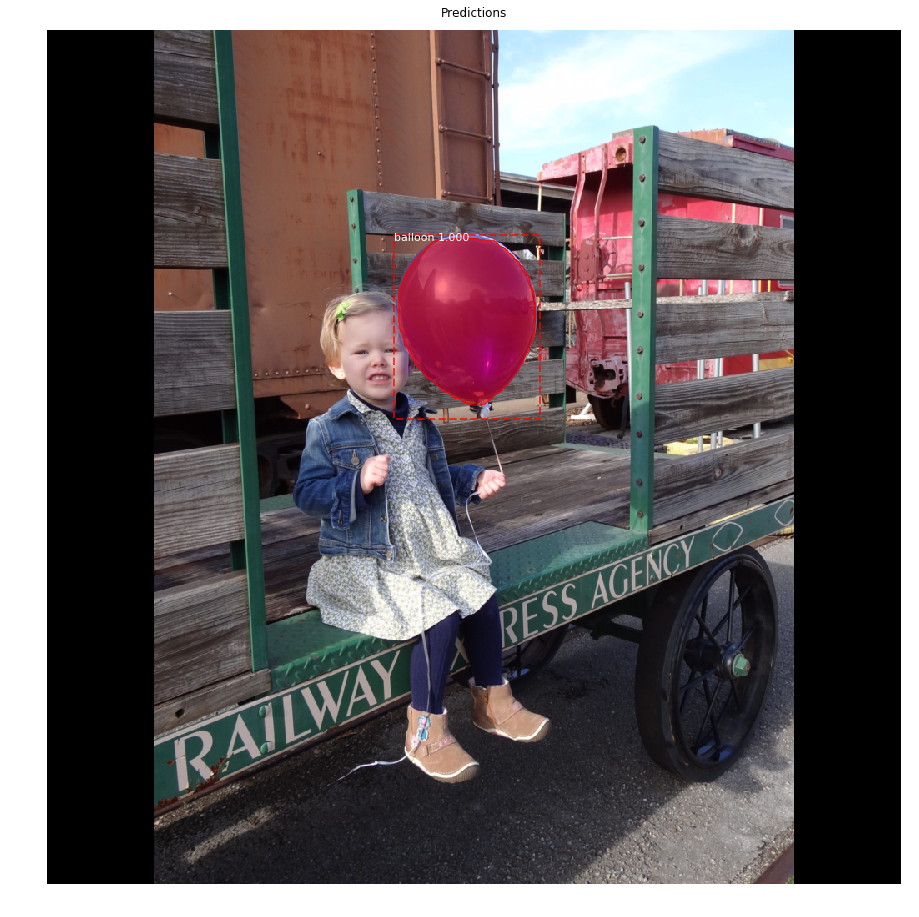

gt_class_id              shape: (1,)                  min:    1.00000  max:    1.00000
gt_bbox                  shape: (1, 4)                min:  244.00000  max:  588.00000
gt_mask                  shape: (1024, 1024, 1)       min:    0.00000  max:    1.00000


In [69]:
image_id = random.choice(dataset.image_ids)
image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset, config, image_id, use_mini_mask=False)
info = dataset.image_info[image_id]
print("image ID: {}.{} ({}) {}".format(info["source"], info["id"], image_id, 
                                       dataset.image_reference(image_id)))

# Run object detection
results = model.detect([image], verbose=1)

# Display results
ax = get_ax(1)
r = results[0]
visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                            dataset.class_names, r['scores'], ax=ax,
                            title="Predictions")
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)

## Color Splash

This is for illustration. You can call `balloon.py` with the `splash` option to get better images without the black padding.

In [ ]:
splash = balloon.color_splash(image, r['masks'])
display_images([splash], cols=1)

## Step by Step Prediction

## Stage 1: Region Proposal Network

The Region Proposal Network (RPN) runs a lightweight binary classifier on a lot of boxes (anchors) over the image and returns object/no-object scores. Anchors with high *objectness* score (positive anchors) are passed to the stage two to be classified.

Often, even positive anchors don't cover objects fully. So the RPN also regresses a refinement (a delta in location and size) to be applied to the anchors to shift it and resize it a bit to the correct boundaries of the object.

### 1.a RPN Targets

The RPN targets are the training values for the RPN. To generate the targets, we start with a grid of anchors that cover the full image at different scales, and then we compute the IoU of the anchors with ground truth object. Positive anchors are those that have an IoU >= 0.7 with any ground truth object, and negative anchors are those that don't cover any object by more than 0.3 IoU. Anchors in between (i.e. cover an object by IoU >= 0.3 but < 0.7) are considered neutral and excluded from training.

To train the RPN regressor, we also compute the shift and resizing needed to make the anchor cover the ground truth object completely.

In [70]:
# Generate RPN trainig targets
# target_rpn_match is 1 for positive anchors, -1 for negative anchors
# and 0 for neutral anchors.
target_rpn_match, target_rpn_bbox = modellib.build_rpn_targets(
    image.shape, model.anchors, gt_class_id, gt_bbox, model.config)
log("target_rpn_match", target_rpn_match)
log("target_rpn_bbox", target_rpn_bbox)

positive_anchor_ix = np.where(target_rpn_match[:] == 1)[0]
negative_anchor_ix = np.where(target_rpn_match[:] == -1)[0]
neutral_anchor_ix = np.where(target_rpn_match[:] == 0)[0]
positive_anchors = model.anchors[positive_anchor_ix]
negative_anchors = model.anchors[negative_anchor_ix]
neutral_anchors = model.anchors[neutral_anchor_ix]
log("positive_anchors", positive_anchors)
log("negative_anchors", negative_anchors)
log("neutral anchors", neutral_anchors)

# Apply refinement deltas to positive anchors
refined_anchors = utils.apply_box_deltas(
    positive_anchors,
    target_rpn_bbox[:positive_anchors.shape[0]] * model.config.RPN_BBOX_STD_DEV)
log("refined_anchors", refined_anchors, )


target_rpn_match         shape: (261888,)             min:   -1.00000  max:    1.00000
target_rpn_bbox          shape: (256, 4)              min:   -2.04690  max:    0.89844
positive_anchors         shape: (1, 4)                min:  224.00000  max:  608.00000
negative_anchors         shape: (255, 4)              min:  -45.25483  max: 1173.01934
neutral anchors          shape: (261632, 4)           min: -362.03867  max: 1322.03867
refined_anchors          shape: (1, 4)                min:  244.00000  max:  588.00000


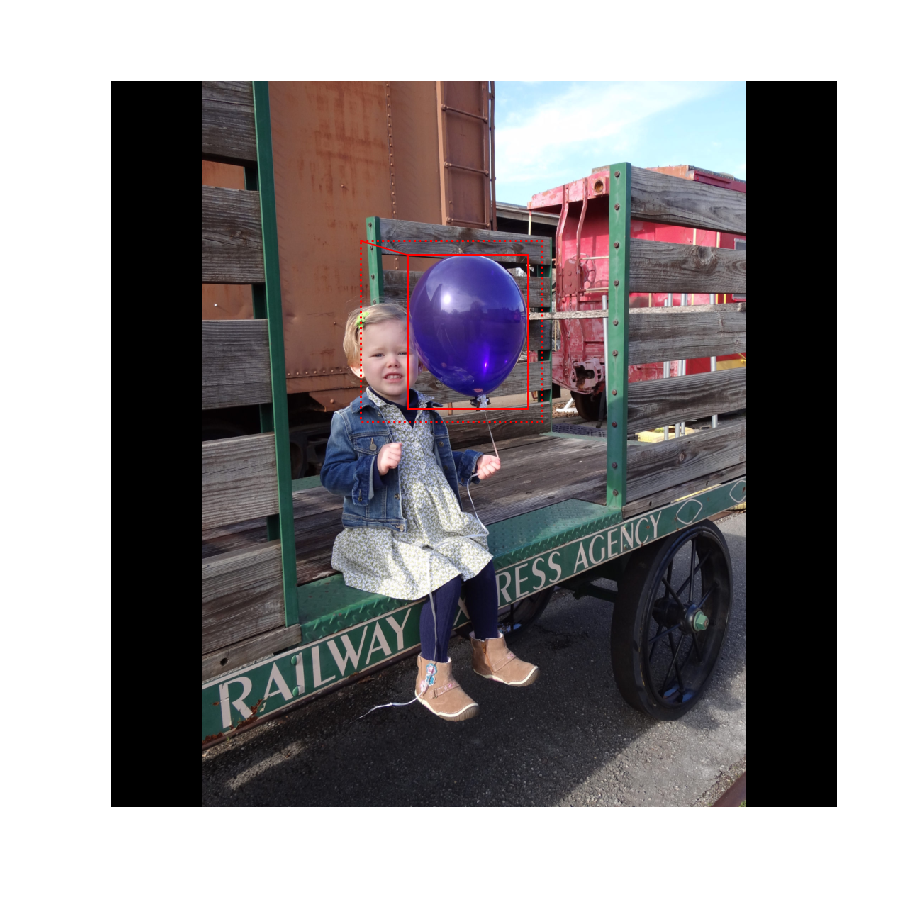

In [71]:
# Display positive anchors before refinement (dotted) and
# after refinement (solid).
visualize.draw_boxes(image, boxes=positive_anchors, refined_boxes=refined_anchors, ax=get_ax())

### 1.b RPN Predictions

Here we run the RPN graph and display its predictions.

In [72]:
# Run RPN sub-graph
pillar = model.keras_model.get_layer("ROI").output  # node to start searching from

# TF 1.4 introduces a new version of NMS. Search for both names to support TF 1.3 and 1.4
nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression:0")
if nms_node is None:
    nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression/NonMaxSuppressionV2:0")

rpn = model.run_graph([image], [
    ("rpn_class", model.keras_model.get_layer("rpn_class").output),
    ("pre_nms_anchors", model.ancestor(pillar, "ROI/pre_nms_anchors:0")),
    ("refined_anchors", model.ancestor(pillar, "ROI/refined_anchors:0")),
    ("refined_anchors_clipped", model.ancestor(pillar, "ROI/refined_anchors_clipped:0")),
    ("post_nms_anchor_ix", nms_node),
    ("proposals", model.keras_model.get_layer("ROI").output),
])

rpn_class                shape: (1, 261888, 2)        min:    0.00000  max:    1.00000
pre_nms_anchors          shape: (1, 6000, 4)          min: -362.03867  max: 1322.03870
refined_anchors          shape: (1, 6000, 4)          min: -10095.19043  max: 11157.91895
refined_anchors_clipped  shape: (1, 6000, 4)          min:    0.00000  max: 1024.00000
post_nms_anchor_ix       shape: (1000,)               min:    0.00000  max: 4370.00000
proposals                shape: (1, 1000, 4)          min:    0.00000  max:    1.00000


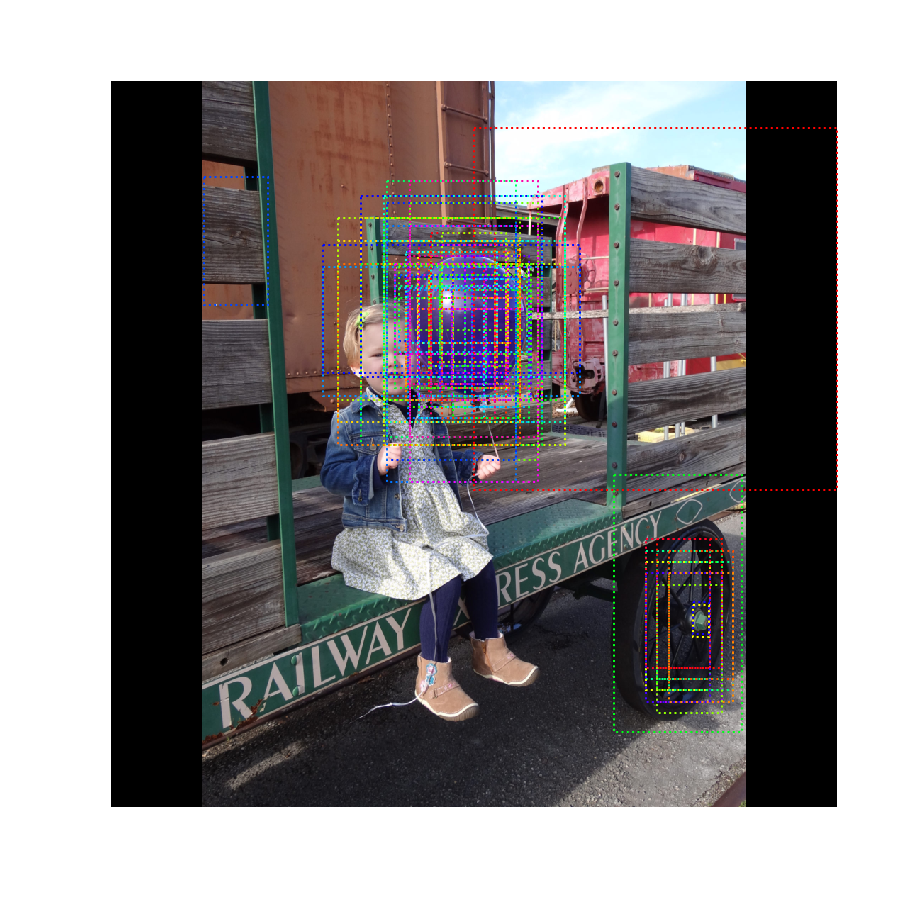

In [73]:
# Show top anchors by score (before refinement)
limit = 100
sorted_anchor_ids = np.argsort(rpn['rpn_class'][:,:,1].flatten())[::-1]
visualize.draw_boxes(image, boxes=model.anchors[sorted_anchor_ids[:limit]], ax=get_ax())

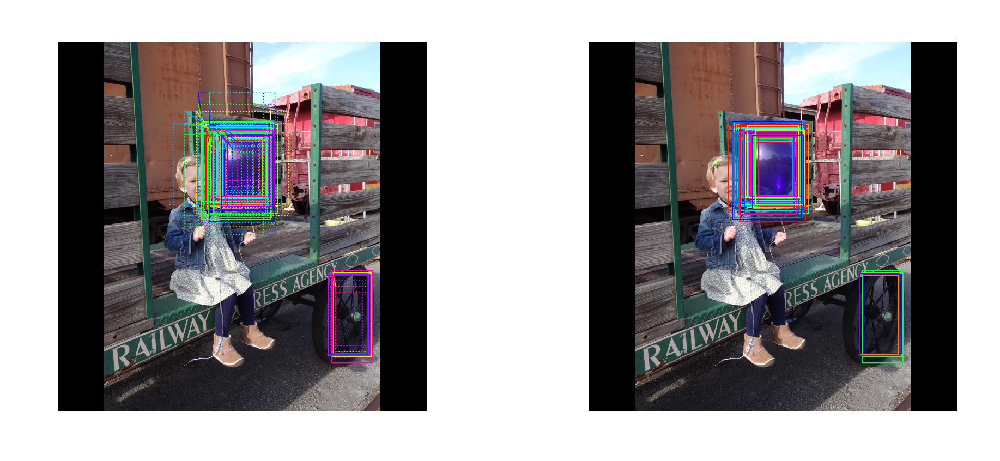

In [74]:
# Show top anchors with refinement. Then with clipping to image boundaries
limit = 50
ax = get_ax(1, 2)
visualize.draw_boxes(image, boxes=rpn["pre_nms_anchors"][0, :limit], 
           refined_boxes=rpn["refined_anchors"][0, :limit], ax=ax[0])
visualize.draw_boxes(image, refined_boxes=rpn["refined_anchors_clipped"][0, :limit], ax=ax[1])

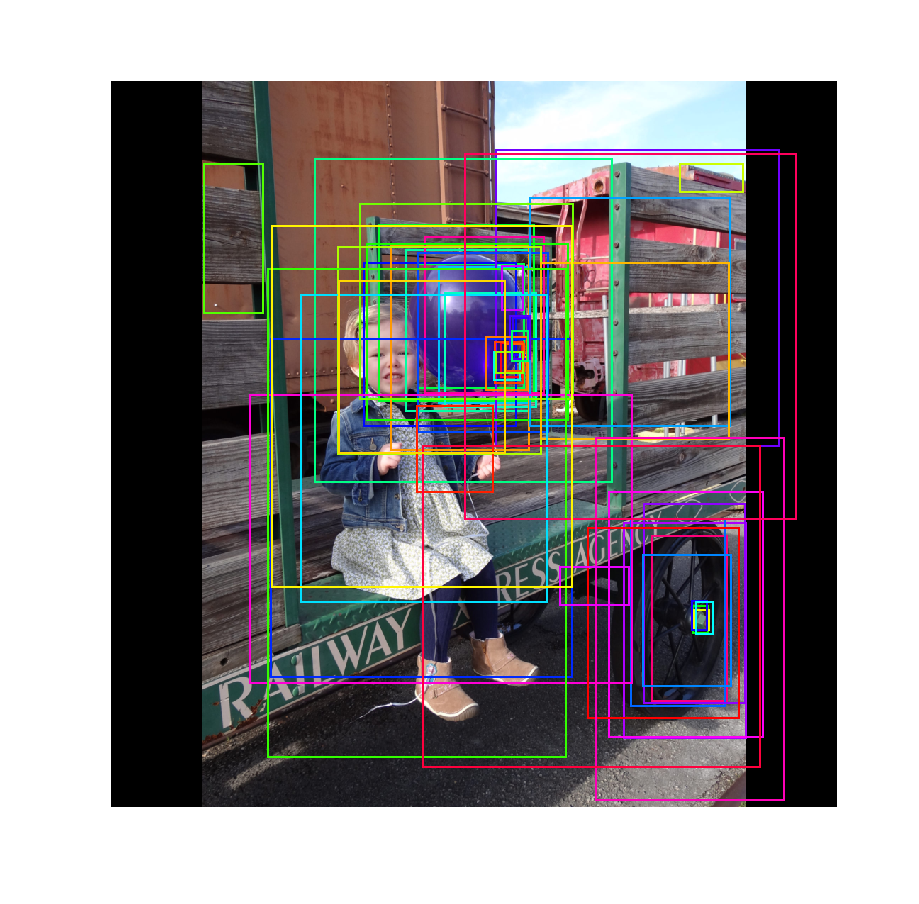

In [75]:
# Show refined anchors after non-max suppression
limit = 50
ixs = rpn["post_nms_anchor_ix"][:limit]
visualize.draw_boxes(image, refined_boxes=rpn["refined_anchors_clipped"][0, ixs], ax=get_ax())

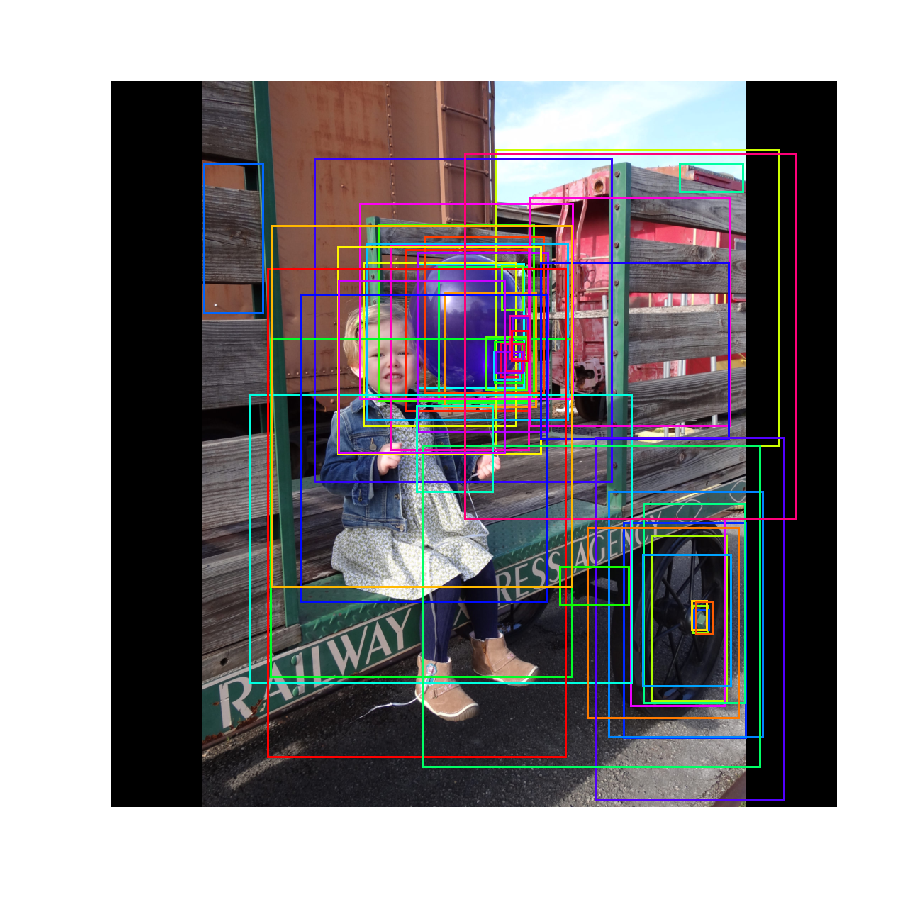

In [76]:
# Show final proposals
# These are the same as the previous step (refined anchors 
# after NMS) but with coordinates normalized to [0, 1] range.
limit = 50
# Convert back to image coordinates for display
h, w = config.IMAGE_SHAPE[:2]
proposals = rpn['proposals'][0, :limit] * np.array([h, w, h, w])
visualize.draw_boxes(image, refined_boxes=proposals, ax=get_ax())

## Stage 2: Proposal Classification

This stage takes the region proposals from the RPN and classifies them.

### 2.a Proposal Classification

Run the classifier heads on proposals to generate class propbabilities and bounding box regressions.

In [77]:
# Get input and output to classifier and mask heads.
mrcnn = model.run_graph([image], [
    ("proposals", model.keras_model.get_layer("ROI").output),
    ("probs", model.keras_model.get_layer("mrcnn_class").output),
    ("deltas", model.keras_model.get_layer("mrcnn_bbox").output),
    ("masks", model.keras_model.get_layer("mrcnn_mask").output),
    ("detections", model.keras_model.get_layer("mrcnn_detection").output),
])

proposals                shape: (1, 1000, 4)          min:    0.00000  max:    1.00000
probs                    shape: (1, 1000, 2)          min:    0.00000  max:    1.00000
deltas                   shape: (1, 1000, 2, 4)       min:   -4.64228  max:    5.44212
masks                    shape: (1, 100, 28, 28, 2)   min:    0.00000  max:    1.00000
detections               shape: (1, 100, 6)           min:    0.00000  max:  591.00000


1 detections: ['balloon']


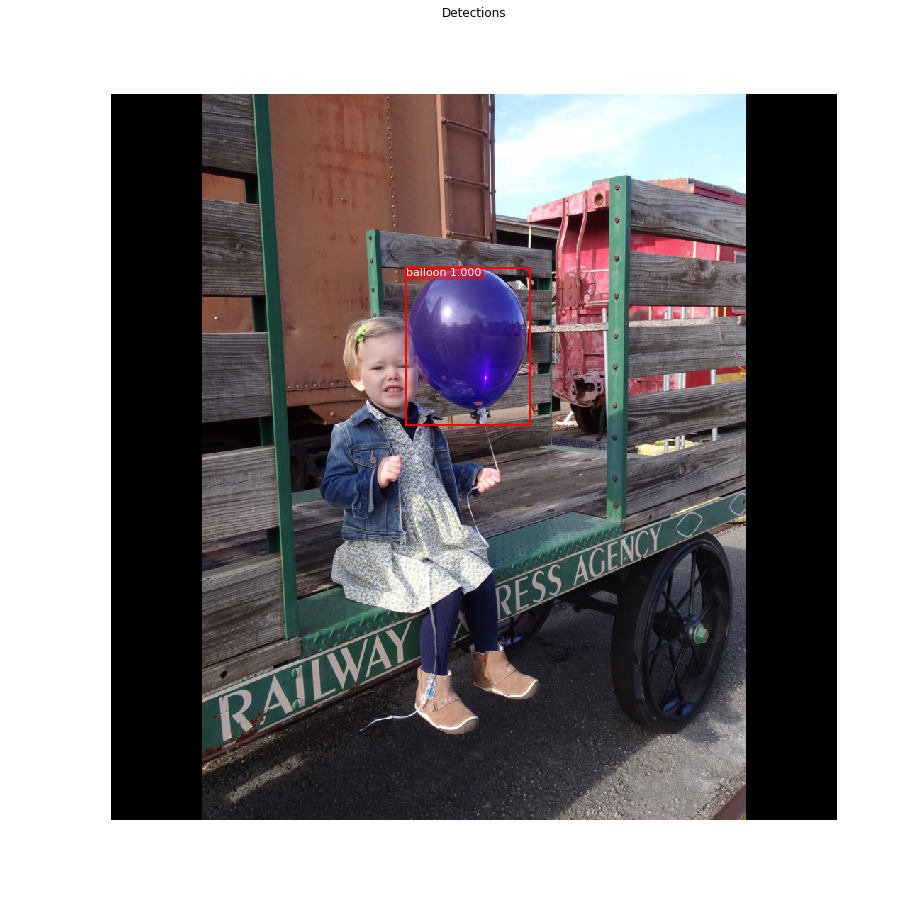

In [78]:
# Get detection class IDs. Trim zero padding.
det_class_ids = mrcnn['detections'][0, :, 4].astype(np.int32)
det_count = np.where(det_class_ids == 0)[0][0]
det_class_ids = det_class_ids[:det_count]
detections = mrcnn['detections'][0, :det_count]

print("{} detections: {}".format(
    det_count, np.array(dataset.class_names)[det_class_ids]))

captions = ["{} {:.3f}".format(dataset.class_names[int(c)], s) if c > 0 else ""
            for c, s in zip(detections[:, 4], detections[:, 5])]
visualize.draw_boxes(
    image, 
    refined_boxes=detections[:, :4],
    visibilities=[2] * len(detections),
    captions=captions, title="Detections",
    ax=get_ax())

### 2.c Step by Step Detection

Here we dive deeper into the process of processing the detections.

In [79]:
# Proposals are in normalized coordinates. Scale them
# to image coordinates.
h, w = config.IMAGE_SHAPE[:2]
proposals = np.around(mrcnn["proposals"][0] * np.array([h, w, h, w])).astype(np.int32)

# Class ID, score, and mask per proposal
roi_class_ids = np.argmax(mrcnn["probs"][0], axis=1)
roi_scores = mrcnn["probs"][0, np.arange(roi_class_ids.shape[0]), roi_class_ids]
roi_class_names = np.array(dataset.class_names)[roi_class_ids]
roi_positive_ixs = np.where(roi_class_ids > 0)[0]

# How many ROIs vs empty rows?
print("{} Valid proposals out of {}".format(np.sum(np.any(proposals, axis=1)), proposals.shape[0]))
print("{} Positive ROIs".format(len(roi_positive_ixs)))

# Class counts
print(list(zip(*np.unique(roi_class_names, return_counts=True))))

1000 Valid proposals out of 1000
20 Positive ROIs
[('BG', 980), ('balloon', 20)]


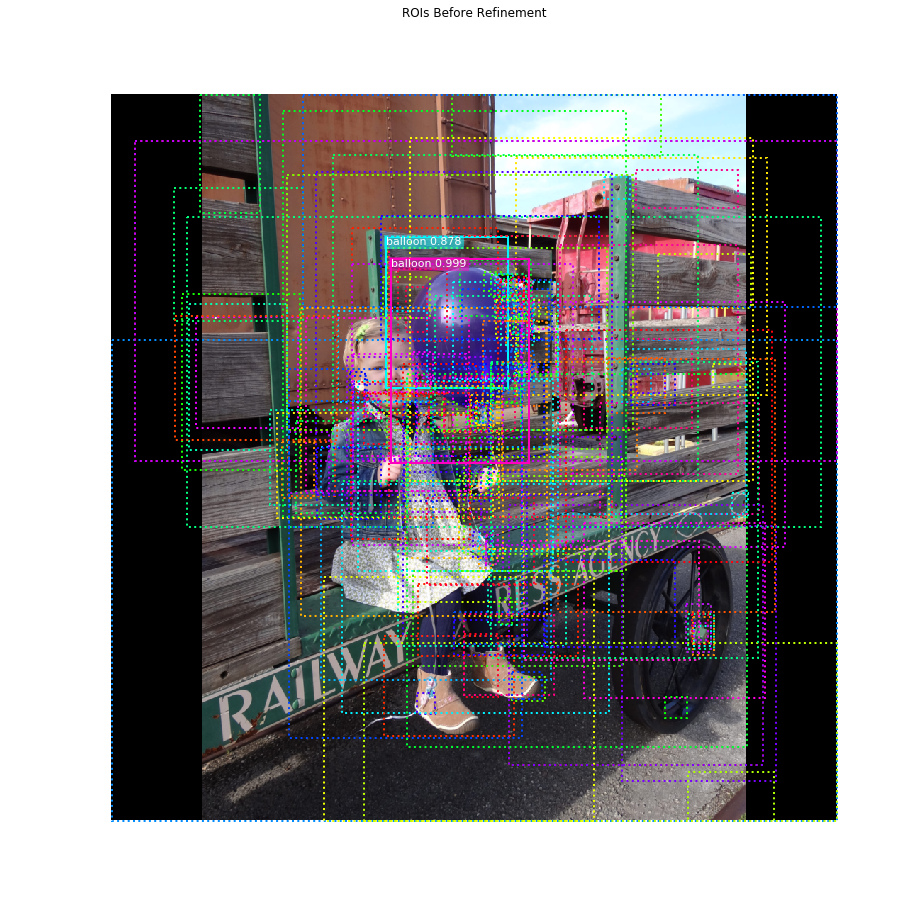

In [80]:
# Display a random sample of proposals.
# Proposals classified as background are dotted, and
# the rest show their class and confidence score.
limit = 200
ixs = np.random.randint(0, proposals.shape[0], limit)
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[ixs], roi_scores[ixs])]
visualize.draw_boxes(image, boxes=proposals[ixs],
                     visibilities=np.where(roi_class_ids[ixs] > 0, 2, 1),
                     captions=captions, title="ROIs Before Refinement",
                     ax=get_ax())

#### Apply Bounding Box Refinement

roi_bbox_specific        shape: (1000, 4)             min:   -4.64228  max:    5.44212
refined_proposals        shape: (1000, 4)             min: -326.00000  max: 1324.00000


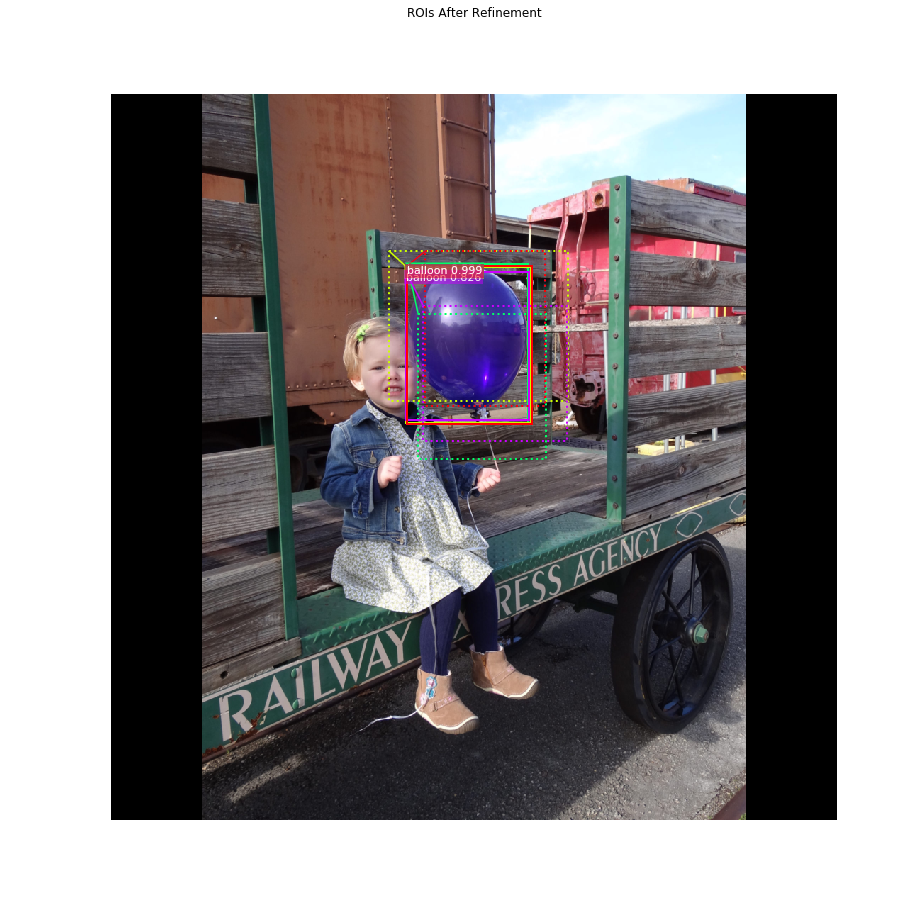

In [81]:
# Class-specific bounding box shifts.
roi_bbox_specific = mrcnn["deltas"][0, np.arange(proposals.shape[0]), roi_class_ids]
log("roi_bbox_specific", roi_bbox_specific)

# Apply bounding box transformations
# Shape: [N, (y1, x1, y2, x2)]
refined_proposals = utils.apply_box_deltas(
    proposals, roi_bbox_specific * config.BBOX_STD_DEV).astype(np.int32)
log("refined_proposals", refined_proposals)

# Show positive proposals
# ids = np.arange(roi_boxes.shape[0])  # Display all
limit = 5
ids = np.random.randint(0, len(roi_positive_ixs), limit)  # Display random sample
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[roi_positive_ixs][ids], roi_scores[roi_positive_ixs][ids])]
visualize.draw_boxes(image, boxes=proposals[roi_positive_ixs][ids],
                     refined_boxes=refined_proposals[roi_positive_ixs][ids],
                     visibilities=np.where(roi_class_ids[roi_positive_ixs][ids] > 0, 1, 0),
                     captions=captions, title="ROIs After Refinement",
                     ax=get_ax())

#### Filter Low Confidence Detections

In [82]:
# Remove boxes classified as background
keep = np.where(roi_class_ids > 0)[0]
print("Keep {} detections:\n{}".format(keep.shape[0], keep))

Keep 20 detections:
[  0   1   3   4   5   8  13  14  16  28  61  84  88 111 122 138 163 350
 528 554]


In [83]:
# Remove low confidence detections
keep = np.intersect1d(keep, np.where(roi_scores >= config.DETECTION_MIN_CONFIDENCE)[0])
print("Remove boxes below {} confidence. Keep {}:\n{}".format(
    config.DETECTION_MIN_CONFIDENCE, keep.shape[0], keep))

Remove boxes below 0.9 confidence. Keep 14:
[  0   1   3   4   5   8  13  14  16  61 111 138 163 350]


#### Per-Class Non-Max Suppression

In [84]:
# Apply per-class non-max suppression
pre_nms_boxes = refined_proposals[keep]
pre_nms_scores = roi_scores[keep]
pre_nms_class_ids = roi_class_ids[keep]

nms_keep = []
for class_id in np.unique(pre_nms_class_ids):
    # Pick detections of this class
    ixs = np.where(pre_nms_class_ids == class_id)[0]
    # Apply NMS
    class_keep = utils.non_max_suppression(pre_nms_boxes[ixs], 
                                            pre_nms_scores[ixs],
                                            config.DETECTION_NMS_THRESHOLD)
    # Map indicies
    class_keep = keep[ixs[class_keep]]
    nms_keep = np.union1d(nms_keep, class_keep)
    print("{:22}: {} -> {}".format(dataset.class_names[class_id][:20], 
                                   keep[ixs], class_keep))

keep = np.intersect1d(keep, nms_keep).astype(np.int32)
print("\nKept after per-class NMS: {}\n{}".format(keep.shape[0], keep))

balloon               : [  0   1   3   4   5   8  13  14  16  61 111 138 163 350] -> [0]

Kept after per-class NMS: 1
[0]


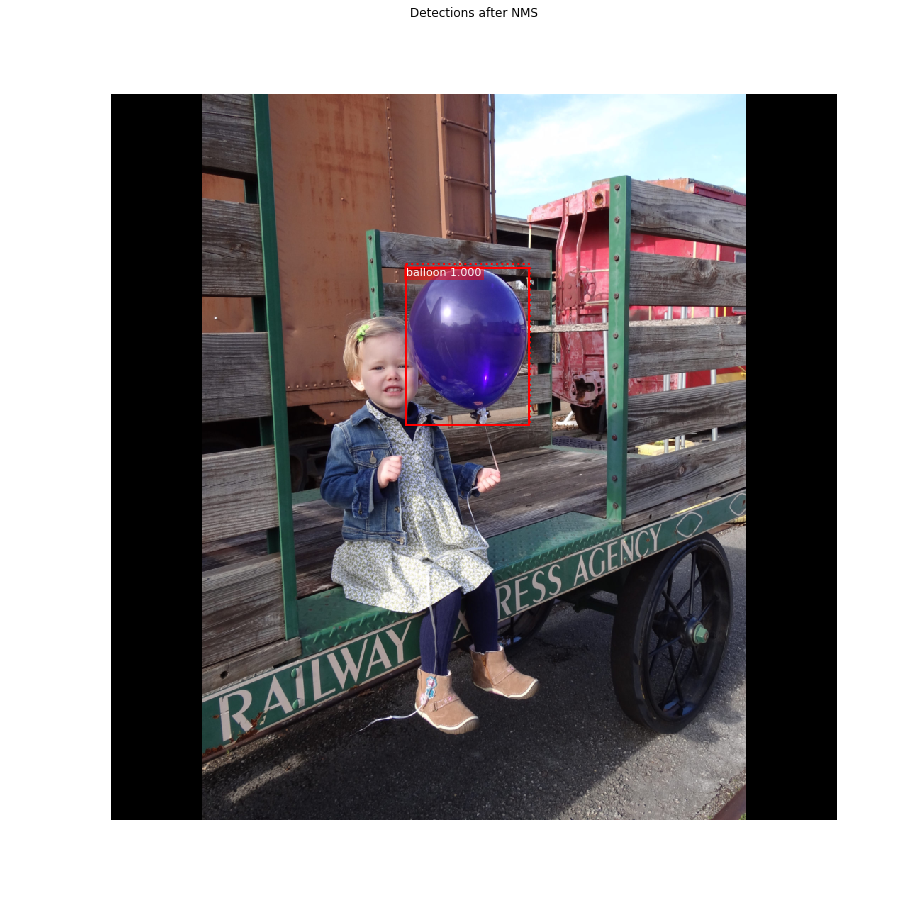

In [85]:
# Show final detections
ixs = np.arange(len(keep))  # Display all
# ixs = np.random.randint(0, len(keep), 10)  # Display random sample
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[keep][ixs], roi_scores[keep][ixs])]
visualize.draw_boxes(
    image, boxes=proposals[keep][ixs],
    refined_boxes=refined_proposals[keep][ixs],
    visibilities=np.where(roi_class_ids[keep][ixs] > 0, 1, 0),
    captions=captions, title="Detections after NMS",
    ax=get_ax())

## Stage 3: Generating Masks

This stage takes the detections (refined bounding boxes and class IDs) from the previous layer and runs the mask head to generate segmentation masks for every instance.

### 3.a Mask Targets

These are the training targets for the mask branch

In [ ]:
display_images(np.transpose(gt_mask, [2, 0, 1]), cmap="Blues")

### 3.b Predicted Masks

In [86]:
# Get predictions of mask head
mrcnn = model.run_graph([image], [
    ("detections", model.keras_model.get_layer("mrcnn_detection").output),
    ("masks", model.keras_model.get_layer("mrcnn_mask").output),
])

# Get detection class IDs. Trim zero padding.
det_class_ids = mrcnn['detections'][0, :, 4].astype(np.int32)
det_count = np.where(det_class_ids == 0)[0][0]
det_class_ids = det_class_ids[:det_count]

print("{} detections: {}".format(
    det_count, np.array(dataset.class_names)[det_class_ids]))

detections               shape: (1, 100, 6)           min:    0.00000  max:  591.00000
masks                    shape: (1, 100, 28, 28, 2)   min:    0.00000  max:    1.00000
1 detections: ['balloon']


In [87]:
# Masks
det_boxes = mrcnn["detections"][0, :, :4].astype(np.int32)
det_mask_specific = np.array([mrcnn["masks"][0, i, :, :, c] 
                              for i, c in enumerate(det_class_ids)])
det_masks = np.array([utils.unmold_mask(m, det_boxes[i], image.shape)
                      for i, m in enumerate(det_mask_specific)])
log("det_mask_specific", det_mask_specific)
log("det_masks", det_masks)

det_mask_specific        shape: (1, 28, 28)           min:    0.00000  max:    1.00000
det_masks                shape: (1, 1024, 1024)       min:    0.00000  max:    1.00000


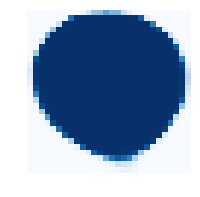

In [88]:
display_images(det_mask_specific[:4] * 255, cmap="Blues", interpolation="none")

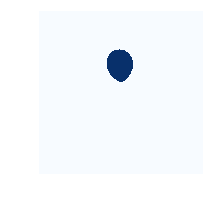

In [89]:
display_images(det_masks[:4] * 255, cmap="Blues", interpolation="none")

## Visualize Activations

In some cases it helps to look at the output from different layers and visualize them to catch issues and odd patterns.

In [ ]:
# Get activations of a few sample layers
activations = model.run_graph([image], [
    ("input_image",        model.keras_model.get_layer("input_image").output),
    ("res2c_out",          model.keras_model.get_layer("res2c_out").output),
    ("res3c_out",          model.keras_model.get_layer("res3c_out").output),
    ("res4w_out",          model.keras_model.get_layer("res4w_out").output),  # for resnet100
    ("rpn_bbox",           model.keras_model.get_layer("rpn_bbox").output),
    ("roi",                model.keras_model.get_layer("ROI").output),
])

In [ ]:
# Input image (normalized)
_ = plt.imshow(modellib.unmold_image(activations["input_image"][0],config))

In [ ]:
# Backbone feature map
display_images(np.transpose(activations["res2c_out"][0,:,:,:4], [2, 0, 1]), cols=4)